<a href="https://colab.research.google.com/github/guptapawan227/Capstone_AIML/blob/Ashish/Recreated_16thDec.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Mounting Google Drive

In [64]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [65]:
!pip3 install ftfy

Importing Libraries

In [66]:
# Using TensorFlow 1.x only in colab as found a issue with 2.3 version used by colab while working with DNN model fit. Did not observe any issue with Tensor flow 2.1 version on local jupyter enviornment.
%tensorflow_version 1.x

In [67]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import time, os, sys, itertools, re 
from PIL import Image
import warnings, pickle, string
from dateutil import parser
%matplotlib inline

# Data Visualization
import cufflinks as cf
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot

from ftfy import fix_text, badness

# Traditional Modeling
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Sequential Modeling
from sklearn import metrics
import tensorflow as tf
import keras.backend as K
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import Input, Dropout, Flatten, Dense, Embedding, LSTM, GRU, Bidirectional, multiply, Permute, merge
from tensorflow.keras.layers import BatchNormalization, TimeDistributed, Conv1D, MaxPooling1D, Activation, Embedding
from tensorflow.keras.constraints import max_norm, unit_norm
from tensorflow.keras.preprocessing.text import Tokenizer, text_to_word_sequence
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


# Tools & Evaluation metrics
from sklearn.metrics import confusion_matrix, classification_report, auc
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split

### Reading the data from excel.

In [68]:
data=pd.read_excel('/content/drive/MyDrive/Capstone/input_data.xlsx')
#data=pd.read_excel('input_data.xlsx')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


## Exploratory Data Analysis

## Univariate visualization
Single-variable or univariate visualization is the simplest type of visualization which consists of observations on only a single characteristic or attribute. Univariate visualization includes histogram, bar plots and line charts.

### The distribution of Assignment groups
Plots how the assignments groups are scattered across the dataset. The bar chart, histogram and pie chart tells the frequency of any ticket assigned to any group OR the tickets count for each group.

In [69]:
data.head()

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [70]:
assignment_group_count=data['Assignment group'].value_counts()
assignment_group_count.describe()

count      74.000000
mean      114.864865
std       465.747516
min         1.000000
25%         5.250000
50%        26.000000
75%        84.000000
max      3976.000000
Name: Assignment group, dtype: float64

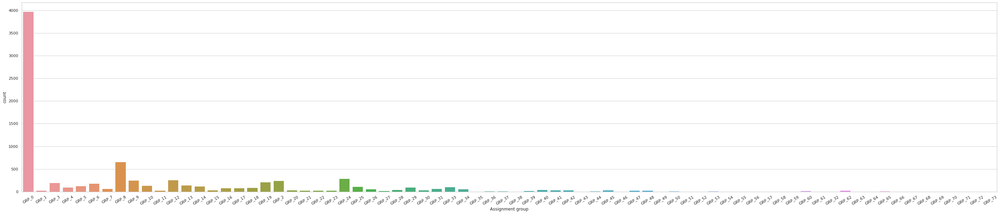

In [71]:
plt.subplots(figsize=(50,10))
ax=sns.countplot(x='Assignment group', data=data)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
plt.tight_layout
plt.show()


In [72]:
assignment_group_count.head(50)

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
GRP_2      241
GRP_19     215
GRP_3      200
GRP_6      184
GRP_13     145
GRP_10     140
GRP_5      129
GRP_14     118
GRP_25     116
GRP_33     107
GRP_4      100
GRP_29      97
GRP_18      88
GRP_16      85
GRP_17      81
GRP_31      69
GRP_7       68
GRP_34      62
GRP_26      56
GRP_40      45
GRP_28      44
GRP_41      40
GRP_15      39
GRP_30      39
GRP_42      37
GRP_20      36
GRP_45      35
GRP_22      31
GRP_1       31
GRP_11      30
GRP_21      29
GRP_47      27
GRP_23      25
GRP_48      25
GRP_62      25
GRP_60      20
GRP_39      19
GRP_27      18
GRP_37      16
GRP_36      15
GRP_44      15
GRP_50      14
GRP_65      11
GRP_53      11
GRP_52       9
Name: Assignment group, dtype: int64

In [73]:
assignment_group_count.tail(24)

GRP_55    8
GRP_51    8
GRP_46    6
GRP_59    6
GRP_49    6
GRP_43    5
GRP_32    4
GRP_66    4
GRP_38    3
GRP_63    3
GRP_58    3
GRP_68    3
GRP_56    3
GRP_57    2
GRP_54    2
GRP_69    2
GRP_72    2
GRP_71    2
GRP_64    1
GRP_61    1
GRP_70    1
GRP_73    1
GRP_67    1
GRP_35    1
Name: Assignment group, dtype: int64

### Check Missing Values in dataframe

In [74]:
data.isnull().sum()

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

In [75]:
data[data["Short description"].isnull()]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0


### Copy Short Description to Description if the Description value is NaN

In [76]:
data.Description.fillna(data["Short description"], inplace = True)

In [77]:
data[data["Description"].isnull()]

,Short description,Description,Caller,Assignment group


In [78]:
data['Short description'] = data['Short description'].replace(np.nan, '', regex=True)

In [79]:
data.isnull().sum()

Short description    0
Description          0
Caller               0
Assignment group     0
dtype: int64

In [80]:
init_notebook_mode()
cf.go_offline()

# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', data['Assignment group'].nunique())

# Histogram
data['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-1)')

# Pie chart
assgn_grp = pd.DataFrame(data.groupby('Assignment group').size(),columns = ['Count']).reset_index()
assgn_grp.iplot(
    kind='pie', 
    labels='Assignment group', 
    values='Count', 
    title='Assignment Group Distribution- Pie Chart (Fig-2)', 
    hoverinfo="label+percent+name", hole=0.25)

Total assignment groups: 74


### Lets visualize the percentage of incidents per assignment group

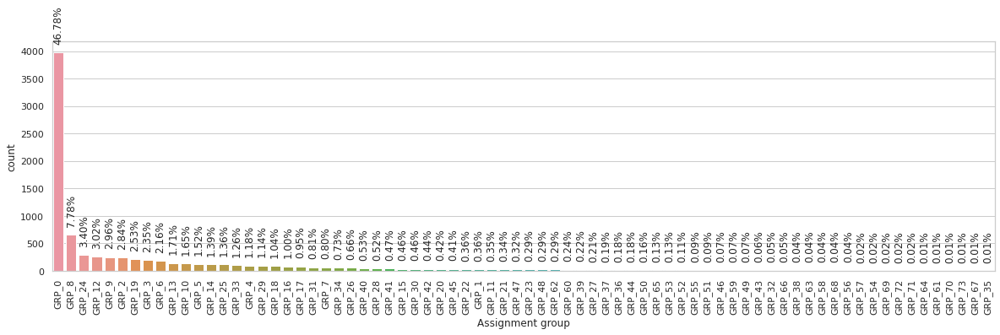

In [81]:
# Plot to visualize the percentage data distribution across different groups
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=data, order=data["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(data.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

### Top 20 and Bottom 20 assignment groups

In [82]:
top_20 = data['Assignment group'].value_counts().nlargest(20).reset_index()

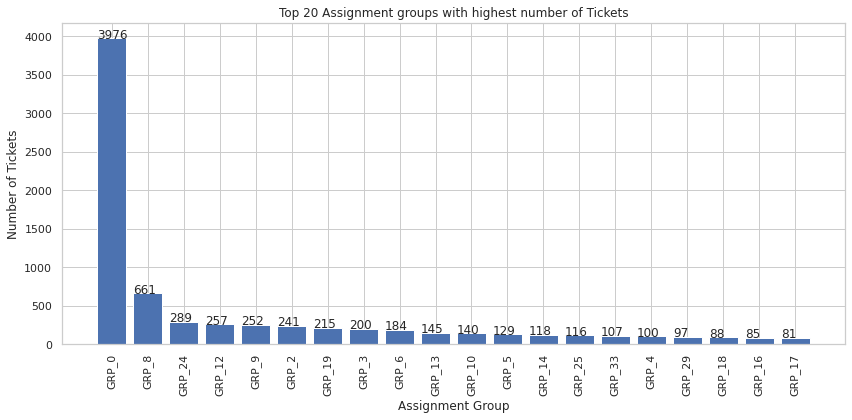

In [83]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_20['index'],top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

In [84]:
bottom_20 = data['Assignment group'].value_counts().nsmallest(20).reset_index()

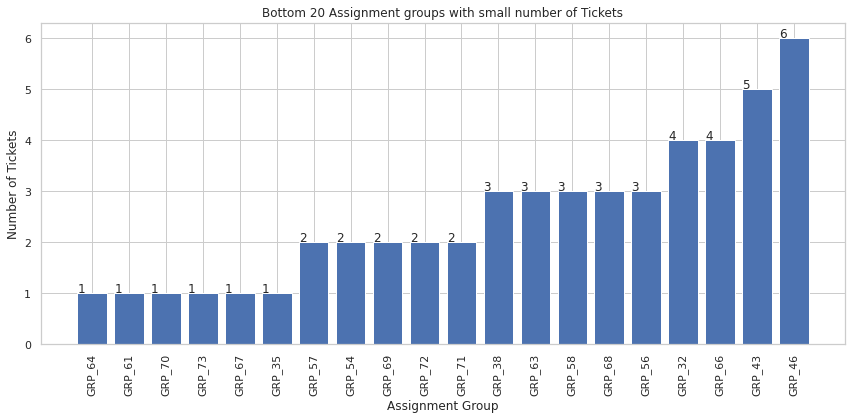

In [85]:
plt.figure(figsize=(12,6))
bars = plt.bar(bottom_20['index'],bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

### The distribution of Callers
Plots how the callers are associated with tickets and what are the assignment groups they most frequently raise tickets for.

In [86]:
# Find out top 10 callers in terms of frequency of raising tickets in the entire dataset
print('\033[1mTotal caller count:\033[0m', data['Caller'].nunique())
df = pd.DataFrame(data.groupby(['Caller']).size().nlargest(10), columns=['Count']).reset_index()
df.iplot(kind='pie',
         labels='Caller', 
         values='Count', 
         title='Top 10 caller- Pie Chart (Fig-7)',
         colorscale='-spectral',
         pull=[0,0,0,0,0.05,0.1,0.15,0.2,0.25,0.3])

Total caller count: 2950


### Top 5 callers in each assignment group

In [87]:
top_n = 5
s = data['Caller'].groupby(data['Assignment group']).value_counts()
caller_grp = pd.DataFrame(s.groupby(level=0).nlargest(top_n).reset_index(level=0, drop=True))
caller_grp.head(15)

Caller
Assignment group Caller                   
GRP_0            fumkcsji sarmtlhy     132
                 rbozivdq gmlhrtvp      86
                 olckhmvx pcqobjnd      54
                 efbwiadp dicafxhv      45
                 mfeyouli ndobtzpw      13
GRP_1            bpctwhsn kzqsbmtp       6
                 jloygrwh acvztedi       4
                 jyoqwxhz clhxsoqy       3
                 spxqmiry zpwgoqju       3
                 kbnfxpsy gehxzayq       2
GRP_10           bpctwhsn kzqsbmtp      60
                 ihfkwzjd erbxoyqk       6
                 dizquolf hlykecxa       5
                 gnasmtvx cwxtsvkm       3
                 hlrmufzx qcdzierm       3

### The distribution of description lengths
Plots the variation of length and word count of new description attribute

In [88]:
data.insert(1, 'desc_len', data['Description'].astype(str).apply(len))
data.insert(5, 'desc_word_count', data['Description'].apply(lambda x: len(str(x).split())))
data.head()

,Short description,desc_len,Description,Caller,Assignment group,desc_word_count
0,login issue,206,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,33
1,outlook,194,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,25
2,cant log in to vpn,87,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,11
3,unable to access hr_tool page,29,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,5
4,skype error,12,skype error,owlgqjme qhcozdfx,GRP_0,2


In [89]:
# Description text length
data['desc_len'].iplot(
    kind='bar',
    xTitle='text length',
    yTitle='count',
    colorscale='-ylgn',
    title='Description Text Length Distribution (Fig-11)')

# Description word count
data['desc_word_count'].iplot(
    kind='bar',
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    colorscale='-bupu',
    title='Description Word Count Distribution (Fig-12)')

## Create a rule based engine

In [90]:
df_rules = pd.read_csv('/content/drive/MyDrive/Capstone/Rule_matrix.csv')
#df_rules = pd.read_csv("Rule_matrix.csv")

In [91]:
def applyRules(datadf,rulesdf,Description,ShortDescription):
    datadf['pred_group'] = np.nan
    for i, row in rulesdf.iterrows():                  
        for j, row in datadf.iterrows():
            if pd.notna(datadf[ShortDescription][j]):
                if (('erp' in datadf[ShortDescription][j]) and (('EU_tool' in datadf[ShortDescription][j]))):
                        datadf['pred_group'][j] = 'GRP_25'
        for j, row in datadf.iterrows():
            if pd.notna(datadf[Description][j]):
                if (datadf[Description][j] == 'the'):
                    datadf['pred_group'][j] = 'GRP_17' 
                
                if (('finance_app' in ((datadf[ShortDescription][j]) or datadf[Description][j])) and ('HostName_1132' not in datadf[ShortDescription][j])):
                    datadf['pred_group'][j] = 'GRP_55'
                
                if (('processor' in datadf[Description][j]) and ('engg' in datadf[Description][j])):
                    datadf['pred_group'][j] = 'GRP_58'
                
                                     
        if rulesdf['Short Desc Rule'][i] == 'begins with' and rulesdf['Desc Rule'][i] == 'begins with' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[ShortDescription][j]) and pd.notna(datadf[Description][j]):
                    if ((datadf[ShortDescription][j].startswith(rulesdf['Short Dec Keyword'][i])) and (datadf[Description][j].startswith(rulesdf['Dec keyword'][i]))):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
                        
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'begins with' and pd.notna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]) and pd.notna(datadf['Caller'][j]):
                    if ((datadf[Description][j].startswith(rulesdf['Desc Rule'][i]) and (rulesdf['User'][i] == datadf['Caller'][j]))):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
                        
        if rulesdf['Short Desc Rule'][i] == 'contains' and pd.notna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if (pd.notna(datadf[ShortDescription][j]) and pd.notna(datadf['Caller'][j])):
                     if ((rulesdf['Short Dec Keyword'][i] in datadf[ShortDescription][j]) and (rulesdf['User'][i] == datadf['Caller'][j])):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if rulesdf['Short Desc Rule'][i] == 'contains' and pd.isna(rulesdf['Desc Rule'][i]) and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[ShortDescription][j]):
                    if (rulesdf['Short Dec Keyword'][i] in datadf[ShortDescription][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'begins with' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (datadf[Description][j].startswith(rulesdf['Dec keyword'][i])):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'contains' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (rulesdf['Dec keyword'][i] in datadf[Description][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'not contain' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (rulesdf['Dec keyword'][i] in datadf[Description][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]


        if rulesdf['Short Desc Rule'][i] == 'not contain' and pd.isna(rulesdf['Desc Rule'][i]) and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():

                if pd.notna(datadf[ShortDescription][j]):
                    if (rulesdf['Short Dec Keyword'][i] in datadf[ShortDescription][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'not contain' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (datadf[Description][j].startswith(rulesdf['Dec keyword'][i])):
                        datadf['pred_group'][j] = rulesdf['Group'][i]
        if pd.isna(rulesdf['Short Desc Rule'][i]) and rulesdf['Desc Rule'][i] == 'contains' and pd.isna(rulesdf['User'][i]):
            for j, row in datadf.iterrows():
                if pd.notna(datadf[Description][j]):
                    if (rulesdf['Dec keyword'][i] in datadf[Description][j]):
                        datadf['pred_group'][j] = rulesdf['Group'][i]

    return datadf

In [92]:
rules_applied_df = applyRules(data,df_rules,'Description','Short description')
rules_applied_df

,Short description,desc_len,Description,Caller,Assignment group,desc_word_count,pred_group
0,login issue,206,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,33,NaN
1,outlook,194,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,25,NaN
2,cant log in to vpn,87,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,11,NaN
3,unable to access hr_tool page,29,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,5,NaN
4,skype error,12,skype error,owlgqjme qhcozdfx,GRP_0,2,NaN
...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,141,\r\n\r\nreceived from: avglmrts.vhqmtiua@gmail...,avglmrts vhqmtiua,GRP_29,19,NaN
8496,telephony_software issue,24,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,2,NaN
8497,vip2: windows password reset for tifpdchb pedx...,50,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,7,NaN
8498,machine nÃ£o estÃ¡ funcionando,103,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,17,NaN


In [93]:
rules_applied_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8500 non-null   object
 1   desc_len           8500 non-null   int64 
 2   Description        8500 non-null   object
 3   Caller             8500 non-null   object
 4   Assignment group   8500 non-null   object
 5   desc_word_count    8500 non-null   int64 
 6   pred_group         301 non-null    object
dtypes: int64(2), object(5)
memory usage: 465.0+ KB


In [94]:
rules_applied_df = rules_applied_df[(rules_applied_df['pred_group'].isna())]
rules_applied_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8199 entries, 0 to 8499
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8199 non-null   object
 1   desc_len           8199 non-null   int64 
 2   Description        8199 non-null   object
 3   Caller             8199 non-null   object
 4   Assignment group   8199 non-null   object
 5   desc_word_count    8199 non-null   int64 
 6   pred_group         0 non-null      object
dtypes: int64(2), object(5)
memory usage: 512.4+ KB


In [95]:
assignment_group_count=rules_applied_df['Assignment group'].value_counts()
assignment_group_count.describe()

count      62.000000
mean      132.241935
std       488.873469
min         1.000000
25%        12.250000
50%        33.000000
75%        99.250000
max      3833.000000
Name: Assignment group, dtype: float64

### Concatenate Short Description and Description Column into New Description, drop the previous columns

In [96]:
#Concatenate Short Description and Description columns
rules_applied_df['New Description'] = rules_applied_df['Description'] + ' ' +rules_applied_df['Short description']

clean_data=rules_applied_df.drop(['Short description', 'Description', 'pred_group', 'desc_len', 'desc_word_count'], axis=1)


In [97]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8199 entries, 0 to 8499
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Caller            8199 non-null   object
 1   Assignment group  8199 non-null   object
 2   New Description   8199 non-null   object
dtypes: object(3)
memory usage: 256.2+ KB


## Fixing Garbled Text/ Mojibake using ftfy library

In [98]:
# Write a function to apply to the dataset to detect Mojibakes
def is_mojibake_impacted(text):
    if not badness.sequence_weirdness(text):
        # nothing weird, should be okay
        return True
    try:
        text.encode('sloppy-windows-1252')
    except UnicodeEncodeError:
        # Not CP-1252 encodable, probably fine
        return True
    else:
        # Encodable as CP-1252, Mojibake alert level high
        return False
# Check the dataset for mojibake impact
clean_data[~clean_data.iloc[:,:].applymap(is_mojibake_impacted).all(1)]

,Caller,Assignment group,New Description
99,ecprjbod litmjwsy,GRP_0,\n\nreceived from: ecprjbod.litmjwsy@gmail.com...
116,bgqpotek cuxakvml,GRP_0,\r\n\r\nreceived from: bgqpotek.cuxakvml@gmail...
124,tvcdfqgp nrbcqwgj,GRP_0,"from: tvcdfqgp nrbcqwgj \nsent: friday, octobe..."
164,tycludks cjofwigv,GRP_0,\n\nreceived from: abcdri@company.com\n\nwindy...
170,fbvpcytz nokypgvx,GRP_18,\n\nreceived from: fbvpcytz.nokypgvx@gmail.com...
...,...,...,...
8470,azxhejvq fyemlavd,GRP_16,"from: mikhghytr wafglhdrhjop \nsent: thursday,..."
8471,xqyjztnm onfusvlz,GRP_30,to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ ç”µ...
8480,nlearzwi ukdzstwi,GRP_9,\r\n\r\nreceived from: nlearzwi.ukdzstwi@gmail...
8498,ufawcgob aowhxjky,GRP_62,i am unable to access the machine utilities to...


In [99]:
# Take an example of row# 8471 Short Desc and fix it
print('Grabled text: \033[1m%s\033[0m\nFixed text: \033[1m%s\033[0m' % (clean_data['New Description'][8471], 
                                                                        fix_text(clean_data['New Description'][8471])))

# List all mojibakes defined in ftfy library
print('\nMojibake Symbol RegEx:\n', badness.MOJIBAKE_SYMBOL_RE.pattern)

Grabled text: to å°è´ºï¼Œæ—©ä¸Šç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥ ç”µè„‘å¼€æœºå¼€ä¸å‡ºæ¥
Fixed text: to 小贺,早上电脑开机开不出来 电脑开机开不出来

Mojibake Symbol RegEx:
 [ÂÃÎÏÐÑØÙĂĎĐŃŘŮ][-€ƒ‚„†‡ˆ‰‹Œ“•˜œŸ¡¢£¤¥¦§¨ª«¬¯°±²³µ¶·¸¹º¼½¾¿ˇ˘˝]|[ÂÃÎÏÐÑØÙĂĎĐŃŘŮ][›»‘”´©™]\w|×[-ƒ‚„†‡ˆ‰‹Œ“•˜œŸ¡¦§¨ª«¬¯°²³ˇ˘›‘”´©™]|[¬√][ÄÅÇÉÑÖÜáàâäãåçéèêëíìîïñúùûü†¢£§¶ß®©™≠ÆØ¥ªæø≤≥]|\w√[±∂]\w|◊|[ðđ][Ÿ]|â€|вЂ[љћ¦°№™ќ“”]


In [100]:
# Sanitize the dataset from Mojibakes
clean_data['New Description'] = clean_data['New Description'].apply(fix_text)

# Visualize that row# 8471
clean_data.loc[8471]

Caller                      xqyjztnm onfusvlz
Assignment group                       GRP_30
New Description     to 小贺,早上电脑开机开不出来 电脑开机开不出来
Name: 8471, dtype: object

## Cleaning & Processing the data

In [101]:
def date_validity(date_str):
    try:
        parser.parse(date_str)
        return True
    except:
        return False

In [102]:

def process(text_string):
    text=text_string.lower()
    text_string = ' '.join([w for w in text_string.split() if not date_validity(w)])
    text_string = re.sub(r"received from:",'',text_string)
    text_string = re.sub(r"from:",' ',text_string)
    text_string = re.sub(r"to:",' ',text_string)
    text_string = re.sub(r"subject:",' ',text_string)
    text_string = re.sub(r"sent:",' ',text_string)
    text_string = re.sub(r"ic:",' ',text_string)
    text_string = re.sub(r"cc:",' ',text_string)
    text_string = re.sub(r"bcc:",' ',text_string)
    text_string = re.sub(r'\S*@\S*\s?', '', text_string)
    text_string = re.sub(r'\d+','' ,text_string)
    text_string = re.sub(r'\n',' ',text_string)
    text_string = re.sub(r'#','', text_string)
    text_string = re.sub(r'&;?', 'and',text_string)
    text_string = re.sub(r'\&\w*;', '', text_string)
    text_string = re.sub(r'https?:\/\/.*\/\w*', '', text_string)  
    text_string= ''.join(c for c in text_string if c <= '\uFFFF') 
    text_string = text_string.strip()
    text_string = re.sub(r"\s+[a-zA-Z]\s+", ' ', text_string)
    text_string = re.sub(' +', ' ', text_string)
    text_string = text_string.replace(r'\b\w\b','').replace(r'\s+', ' ')
    text_string = text_string.strip()
    return text_string


In [103]:
clean_data["Clean_Description"] = clean_data["New Description"].apply(process)

In [104]:
clean_data

,Caller,Assignment group,New Description,Clean_Description
0,spxjnwir pjlcoqds,GRP_0,-verified user details.(employee# & manager na...,-verified user details.(employee and manager n...
1,hmjdrvpb komuaywn,GRP_0,\n\nreceived from: hmjdrvpb.komuaywn@gmail.com...,"hello team, my meetings/skype meetings etc are..."
2,eylqgodm ybqkwiam,GRP_0,\n\nreceived from: eylqgodm.ybqkwiam@gmail.com...,hi cannot log on to vpn best cant log in to vpn
3,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,unable to access hr_tool page unable to access...
4,owlgqjme qhcozdfx,GRP_0,skype error skype error,skype error skype error
...,...,...,...,...
8495,avglmrts vhqmtiua,GRP_29,\n\nreceived from: avglmrts.vhqmtiua@gmail.com...,"good afternoon, am not receiving the emails th..."
8496,rbozivdq gmlhrtvp,GRP_0,telephony_software issue telephony_software issue,telephony_software issue telephony_software issue
8497,oybwdsgx oxyhwrfz,GRP_0,vip2: windows password reset for tifpdchb pedx...,vip: windows password reset for tifpdchb pedxr...
8498,ufawcgob aowhxjky,GRP_62,i am unable to access the machine utilities to...,i am unable to access the machine utilities to...


## Language Translation

### Dataset has many language text, prominently German and Chinese. See below chart. 


In [ ]:
!pip install langdetect

In [ ]:
from langdetect import detect
    
def fn_lang_detect(df):                                        
   try:                                                          
      return detect(df)                                      
   except:                                                       
      return 'no'                                                  

clean_data['language'] = clean_data['Clean_Description'].apply(fn_lang_detect)

In [ ]:
x = clean_data["language"].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')
plt.show();

### We are using the google translate api's for Language conversion. But using library packages such as Goslate, there is restrictions to convert number of records. Due to this we have used Googletranslate functionality in google sheets for Language conversion. https://support.google.com/docs/answer/3093331?hl=en

#### Loading the consolidated final translated pickle file which contains the language translations done offline. 

In [105]:
with open('/content/drive/MyDrive/Capstone/final_translated.pkl','rb') as f:
#with open('final_translated.pkl','rb') as f:
    clean_data = pickle.load(f)

In [106]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8466 entries, 0 to 48
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Caller             8466 non-null   object
 1   Assignment group   8466 non-null   object
 2   New Description    8466 non-null   object
 3   Clean_Description  8466 non-null   object
 4   language           8466 non-null   object
 5   Translated Text    8466 non-null   object
dtypes: object(6)
memory usage: 463.0+ KB


In [107]:
#check the dataframe
clean_data.tail()

,Caller,Assignment group,New Description,Clean_Description,language,Translated Text
44,wgmqlnzh vpebwoat,GRP_30,早上开机后显示器不出图像。 显示器不亮,早上开机后显示器不出图像。 显示器不亮,zh-cn,The display does not appear in the morning. Di...
45,rtjwbuev gfpwdetq,GRP_31,"prtSID_737--文件无法打印到打印机,提示打印机错误。 文件无法打印到打印机,提示打...","prtSID_--文件无法打印到打印机,提示打印机错误。 文件无法打印到打印机,提示打印机错误。",zh-cn,The prtsid _- file cannot be printed to the pr...
46,fupikdoa gjkytoeh,GRP_48,"客户提供的在线送货单生成系统打不开,需尽快解决 客户提供的在线系统打不开","客户提供的在线送货单生成系统打不开,需尽快解决 客户提供的在线系统打不开",zh-cn,The online delivery unit provided by the custo...
47,kyagjxdh dmtjpbnz,GRP_30,"进行采购时显示""找不到员工1111154833的数据,请通知系统管理员"" erp无法进行采购...","进行采购时显示""找不到员工的数据,请通知系统管理员"" erp无法进行采购(转给贺正平)",zh-cn,"Show ""Data from the employee, please notify th..."
48,xqyjztnm onfusvlz,GRP_30,"to 小贺,早上电脑开机开不出来 电脑开机开不出来","to 小贺,早上电脑开机开不出来 电脑开机开不出来",zh-cn,"To small congratulations, the computer does no..."


In [108]:
assignment_group_cnt=clean_data['Assignment group'].value_counts()
assignment_group_cnt.describe()

count      43.000000
mean      196.883721
std       596.778064
min        16.000000
25%        31.000000
50%        68.000000
75%       145.500000
max      3941.000000
Name: Assignment group, dtype: float64

# Data Augmentation - using https://github.com/makcedward/nlpaug

In [ ]:
#Install NLPAug Package
!pip install nlpaug

In [ ]:
#Install dependencies for nlpaug
!pip install torch>=1.6.0 transformers>=4.0.0
!pip install nltk>=3.4.5

In [ ]:
#We will use Word Augmentation methods from nlpaug library. nlpaug supports character, word and sentence level augmentation methods
import nlpaug.augmenter.word as naw

In [ ]:
#Word embedding augmentation method
aug1 = naw.WordEmbsAug(model_type='glove', model_path='glove.6B/glove.6B.50d.txt', action="substitute")
aug2 = naw.WordEmbsAug(model_type='glove', model_path='glove.6B/glove.6B.50d.txt', action="insert")


In [ ]:
#Contextual Word augmentation method
aug3 = naw.ContextualWordEmbsAug(model_path='bert-base-uncased', action="substitute")
aug4 = naw.ContextualWordEmbsAug(model_path='roberta-base', action="substitute")


In [ ]:
#Synonym Augmentation method using PPDB models downloaded from http://paraphrase.org/#/download
aug5 = naw.SynonymAug(aug_src='ppdb', model_path='ppdb-2.0-s-all')


In [ ]:
#!pip3 install nltk
import nltk 
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import wordnet

In [ ]:
#Create a new dataframe with records not in GRP_0. We will Augment data for all groups except GRP_0
zero_dataframe = clean_data[clean_data["Assignment group"] == 'GRP_0']
new_dataframe = clean_data[clean_data["Assignment group"] != 'GRP_0']
zero_dataframe.head()


In [ ]:
#Create dataframe copies for different augmentation methods
new_dataframe2 = new_dataframe.copy()
new_dataframe3 = new_dataframe.copy()
new_dataframe4 = new_dataframe.copy()
new_dataframe5 = new_dataframe.copy()
new_dataframe6 = new_dataframe.copy()

In [ ]:
# shape of all dataframes
new_dataframe.shape, zero_dataframe.shape, new_dataframe2.shape, new_dataframe3.shape, new_dataframe4.shape, new_dataframe5.shape

In [ ]:
new_dataframe["Augmented_data"] = new_dataframe.apply(lambda x: aug1.augment(x['Translated_Text']),axis=1)
new_dataframe

In [ ]:
s = new_dataframe.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
new_dataframe_aug = new_dataframe.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated_Text'],axis=1).join(s)
new_dataframe_aug

In [ ]:
new_dataframe2["Augmented_data"] = new_dataframe2.apply(lambda x: aug2.augment(x['Translated_Text']),axis=1)
new_dataframe2

In [ ]:
s = new_dataframe2.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
new_dataframe_aug2 = new_dataframe2.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated_Text'],axis=1).join(s)
new_dataframe_aug2

In [ ]:
new_dataframe3["Augmented_data"] = new_dataframe3.apply(lambda x: aug3.augment(x['Translated_Text']),axis=1)
new_dataframe3

In [ ]:
s = new_dataframe3.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
new_dataframe_aug3 = new_dataframe3.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated_Text'],axis=1).join(s)
new_dataframe_aug3

In [ ]:
new_dataframe4["Augmented_data"] = new_dataframe4.apply(lambda x: aug4.augment(x['Translated_Text']),axis=1)
new_dataframe4

In [ ]:
s = new_dataframe4.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
new_dataframe_aug4 = new_dataframe4.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated_Text'],axis=1).join(s)
new_dataframe_aug4

In [ ]:
new_dataframe5["Augmented_data"] = new_dataframe5.apply(lambda x: aug5.augment(x['Translated_Text']),axis=1)
new_dataframe5

In [ ]:
s = new_dataframe5.apply(lambda x: pd.Series(x['Augmented_data']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'Final_Text'
new_dataframe_aug5 = new_dataframe5.drop(['New Description','Augmented_data', 'Clean_Description', 'Translated_Text'],axis=1).join(s)
new_dataframe_aug5

In [ ]:
# Grp_0 dataframe
zero_dataframe = zero_dataframe.rename(columns={"Translated_Text": "Final_Text"})
zero_dataframe = zero_dataframe.drop(['New Description', 'Clean_Description'], axis = 1)


In [ ]:
zero_dataframe

In [ ]:
#Original data (without Augmentation)

new_dataframe6 = new_dataframe6.rename(columns={"Translated_Text": "Final_Text"})
new_dataframe6 = new_dataframe6.drop(['New Description', 'Clean_Description'], axis = 1)
new_dataframe6

In [ ]:
new_dataframe6

In [ ]:
# Concat all the augmented frames
dataframes=[new_dataframe_aug, new_dataframe_aug2, new_dataframe_aug3, new_dataframe_aug4, new_dataframe_aug5, zero_dataframe, new_dataframe6]
clean_data_result= pd.concat(dataframes)
clean_data_result

In [ ]:
#Remove any duplicate rows after augmentation
clean_data_result = clean_data_result.drop_duplicates(subset='Final_Text', keep="first")

In [ ]:
# Serialize the Augmented dataset for later use
clean_data_result.to_csv('Interim_data.csv', index=False, encoding='utf_8_sig')
#with open('/content/Interim_data.pkl','wb') as f:
with open('/content/drive/MyDrive/Capstone/Interim_data.pkl','wb') as f:
    pickle.dump(clean_data_result, f, pickle.HIGHEST_PROTOCOL)

### Interim_data.pkl file will be used later for DL models as we wont be performing stop words removal and lemmatisation on it.

In [ ]:
# Load the consolidated final translated pickle file 
#with open('/content/drive/MyDrive/Capstone/Interim_data.pkl','rb') as f:
with open('/content/drive/MyDrive/Capstone/Interim_data.pkl','rb') as f:
    clean_data_result = pickle.load(f)

In [ ]:
clean_data_result

## Stop words removal and Lemmatise text

In [ ]:
clean_data_result.isnull().sum()

In [120]:
clean_data_result['Final_Text'] = clean_data_result['Final_Text'].fillna("")

In [121]:
import re
import string
nltk.download('stopwords')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

stop_words = set(stopwords.words('english')) 

processed_all_documents = list()

for desc in clean_data_result['Final_Text']:
    word_tokens = word_tokenize(desc) 
    
    filtered_sentence = [] 

    # Removing Stopwords
    for w in word_tokens: 
        if w not in stop_words: 
            filtered_sentence.append(w) 

    words = ' '.join(filtered_sentence)
    processed_all_documents.append(words)  

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [122]:
clean_data_result['Final_Text'] = processed_all_documents

In [123]:
clean_data_result.head(50)

,Caller,Assignment group,language,Final_Text
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello 's happened The PC released repeated tim...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello 's happen The PC released repeated times...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello 's happened The PC released repeated tim...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello 's happened The PC released repeated tim...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello 's happened The PC let go repeated times...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello Ben Tige Number Block Keyboard R Left Ha...
0,vrfpyjwi nzhvgqiw,GRP_24,de,Hello Ben Tige number Block Keyboard R Left Ha...
0,vrfpyjwi nzhvgqiw,GRP_24,de,Hello Ben Tige Number block Keyboard R Left Ha...
0,vrfpyjwi nzhvgqiw,GRP_24,de,Hello Ben Tige Number Block keyboard R Left Ha...
0,vrfpyjwi nzhvgqiw,GRP_24,de,Hello Ben Tige Number Block Keyboard R left Ha...


In [127]:
#Lemmatisation using spacy library
!pip3 install spacy

In [128]:
!pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.3.1/en_core_web_sm-2.3.1.tar.gz

     |████████████████████████████████| 12.1MB 250kB/s 
     |████████████████████████████████| 10.4MB 9.1MB/s 
     |████████████████████████████████| 1.1MB 55.8MB/s 
  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.3.1-cp36-none-any.whl size=12047110 sha256=c4fd302e7efc71b0dbe764f35ffe873c396e3a6ff9d8e11270a880c74edc4d72
  Stored in directory: /root/.cache/pip/wheels/2b/3f/41/f0b92863355c3ba34bb32b37d8a0c662959da0058202094f46
Successfully built en-core-web-sm
  Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Found existing installation: spacy 2.2.4
    Uninstalling spacy-2.2.4:
      Successfully uninstalled spacy-2.2.4
  Found existing installation: en-core-web-sm 2.2.5
    Uninstalling en-core-web-sm-2.2.5:
      Successfully uninstalled en-core-web-sm-2.2.5


#### Need to run "python -m spacy download en" in anaconda prompt to avoid 'en' not found issue.

In [131]:
import spacy

nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']
def lemmatize_text(text):
    doc = nlp(text)
    return ' '.join([token.lemma_ for token in doc])

clean_data_result['Final_Text'] = clean_data_result['Final_Text'].apply(lemmatize_text)

In [132]:
clean_data_result

,Caller,Assignment group,language,Final_Text
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello be happen the pc release repeat time blu...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello be happen the pc release repeat time blu...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello be happen the pc release repeat time blu...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello be happen the pc release repeat time blu...
0,vrfpyjwi nzhvgqiw,GRP_24,de,hello be happen the pc let go repeat time blue...
...,...,...,...,...
87,gasbfqvp fmvqgjih,GRP_0,de,"on part , password incorrectly enter please pa..."
97,nizholae bjnqikym,GRP_0,de,Stephryhan need Access below Collaboration Pla...
100,bmhrsxlf ukatbwyi,GRP_0,de,benefit issue benefit issue
101,sjxhcyrq iupxtjcf,GRP_0,de,Security Error travel expense Billing ProgramD...


In [133]:
# Serialize the translated dataset
clean_data_result.to_csv('Final_data.csv', index=False, encoding='utf_8_sig')
with open('/content/Final_data.pkl','wb') as f:
    pickle.dump(clean_data_result, f, pickle.HIGHEST_PROTOCOL)

In [134]:
# Load the translated pickle file 
with open('/content/Final_data.pkl','rb') as f:
    clean_data = pickle.load(f)

## Manual inspection showed that groups having Monitoring tool emails and Job scheduler errors are dropping the accuracy as they dont have paterns for Machine Learning algorithms. 

## Moving them into 1 seperate group called "GRP_MonitoringTool".

In [ ]:
#Moving all the records coming from monitoring tool/job scheduler to one group

clean_data.loc[(clean_data['Final_Text'].astype(str).str.contains('scheduler')), 'Assignment group'] = "GRP_MonitoringTool"


In [ ]:
assignment_group_cnt=clean_data['Assignment group'].value_counts()
assignment_group_cnt.describe()

In [ ]:
assignment_group_cnt = clean_data['Assignment group'].value_counts().rename_axis('Grp_name').reset_index(name='counts')

In [ ]:
assignment_group_cnt 

## Also noticeds that groups having less than 500 records post augmentation is dropping overall model efficiency. 

## Resampling the groups having less than 500 records to take care of above concern

In [ ]:
#Sory for the messy code, didnt have patience to write a lambda function. Splitting dataframes with < 500 records for resampling
temp_dataframe = clean_data[(clean_data["Assignment group"] == 'GRP_43') | (clean_data["Assignment group"] == 'GRP_46') | (clean_data["Assignment group"] == 'GRP_59') | (clean_data["Assignment group"] == 'GRP_49') | (clean_data["Assignment group"] == 'GRP_60') | (clean_data["Assignment group"] == 'GRP_51') | (clean_data["Assignment group"] == 'GRP_52') | (clean_data["Assignment group"] == 'GRP_65') | (clean_data["Assignment group"] == 'GRP_53') | (clean_data["Assignment group"] == 'GRP_39') | (clean_data["Assignment group"] == 'GRP_36') | (clean_data["Assignment group"] == 'GRP_50') | (clean_data["Assignment group"] == 'GRP_44') | (clean_data["Assignment group"] == 'GRP_47') | (clean_data["Assignment group"] == 'GRP_37') | (clean_data["Assignment group"] == 'GRP_27') | (clean_data["Assignment group"] == 'GRP_5') | (clean_data["Assignment group"] == 'GRP_1') | (clean_data["Assignment group"] == 'GRP_62') | (clean_data["Assignment group"] == 'GRP_23') | (clean_data["Assignment group"] == 'GRP_17') | (clean_data["Assignment group"] == 'GRP_48') | (clean_data["Assignment group"] == 'GRP_45') | (clean_data["Assignment group"] == 'GRP_21') | (clean_data["Assignment group"] == 'GRP_11') | (clean_data["Assignment group"] == 'GRP_22') | (clean_data["Assignment group"] == 'GRP_20') | (clean_data["Assignment group"] == 'GRP_42') | (clean_data["Assignment group"] == 'GRP_30') | (clean_data["Assignment group"] == 'GRP_15') | (clean_data["Assignment group"] == 'GRP_41') | (clean_data["Assignment group"] == 'GRP_28') | (clean_data["Assignment group"] == 'GRP_40') | (clean_data["Assignment group"] == 'GRP_26') | (clean_data["Assignment group"] == 'GRP_34') | (clean_data["Assignment group"] == 'GRP_6') | (clean_data["Assignment group"] == 'GRP_7') | (clean_data["Assignment group"] == 'GRP_31') | (clean_data["Assignment group"] == 'GRP_9') | (clean_data["Assignment group"] == 'GRP_10')]
temp_dataframe2 = clean_data[(clean_data["Assignment group"] != 'GRP_43') & (clean_data["Assignment group"] != 'GRP_46') & (clean_data["Assignment group"] != 'GRP_59') & (clean_data["Assignment group"] != 'GRP_49') & (clean_data["Assignment group"] != 'GRP_60') & (clean_data["Assignment group"] != 'GRP_51') & (clean_data["Assignment group"] != 'GRP_52') & (clean_data["Assignment group"] != 'GRP_65') & (clean_data["Assignment group"] != 'GRP_53') & (clean_data["Assignment group"] != 'GRP_39') & (clean_data["Assignment group"] != 'GRP_36') & (clean_data["Assignment group"] != 'GRP_50') & (clean_data["Assignment group"] != 'GRP_44') & (clean_data["Assignment group"] != 'GRP_47') & (clean_data["Assignment group"] != 'GRP_37') & (clean_data["Assignment group"] != 'GRP_27') & (clean_data["Assignment group"] != 'GRP_5') & (clean_data["Assignment group"] != 'GRP_1') & (clean_data["Assignment group"] != 'GRP_62') & (clean_data["Assignment group"] != 'GRP_23') & (clean_data["Assignment group"] != 'GRP_17') & (clean_data["Assignment group"] != 'GRP_48') & (clean_data["Assignment group"] != 'GRP_45') & (clean_data["Assignment group"] != 'GRP_21') & (clean_data["Assignment group"] != 'GRP_11') & (clean_data["Assignment group"] != 'GRP_22') & (clean_data["Assignment group"] != 'GRP_20') & (clean_data["Assignment group"] != 'GRP_42') & (clean_data["Assignment group"] != 'GRP_30') & (clean_data["Assignment group"] != 'GRP_15') & (clean_data["Assignment group"] != 'GRP_41') & (clean_data["Assignment group"] != 'GRP_28') & (clean_data["Assignment group"] != 'GRP_40') & (clean_data["Assignment group"] != 'GRP_26') & (clean_data["Assignment group"] != 'GRP_34') & (clean_data["Assignment group"] != 'GRP_6') & (clean_data["Assignment group"] != 'GRP_7') & (clean_data["Assignment group"] != 'GRP_31') & (clean_data["Assignment group"] != 'GRP_9') & (clean_data["Assignment group"] != 'GRP_10')]
temp_dataframe2

In [ ]:
assignment_group_cnt2 = temp_dataframe2['Assignment group'].value_counts().rename_axis('Grp_name').reset_index(name='counts')

In [ ]:
assignment_group_cnt2

In [ ]:
#resampling all groups having less than 500 records
from sklearn.utils import resample
clean_data_resampled = temp_dataframe[0:0]
for grp in temp_dataframe['Assignment group'].unique():
    temp_dataframe1 = temp_dataframe.apply(lambda x : True
            if str(temp_dataframe['Assignment group']) == grp else False, axis = 1)
    num_rows = len(temp_dataframe1[temp_dataframe1 == True].index) 
    if(num_rows < 500):
            temp_dataframeGrpDF = temp_dataframe[temp_dataframe['Assignment group'] == grp]
            resampled = resample(temp_dataframeGrpDF, replace=True, n_samples=500, random_state=123)
            clean_data_resampled = clean_data_resampled.append(resampled)

In [ ]:
clean_data_resampled

In [ ]:
#Concat dataframes post resampling
dataframes=[clean_data_resampled, temp_dataframe2]
clean_data_resampled= pd.concat(dataframes)
clean_data_resampled

In [ ]:
assignment_group_cnt3 = clean_data_resampled['Assignment group'].value_counts().rename_axis('Grp_name').reset_index(name='counts')
assignment_group_cnt3

In [ ]:
# Saving Final pkl file after resampling
clean_data_resampled.to_csv('Final_data_resampled.csv', index=False, encoding='utf_8_sig')
#with open('/content/Final_data.pkl','wb') as f:
with open('Final_data_resampled.pkl','wb') as f:
    pickle.dump(clean_data_resampled, f, pickle.HIGHEST_PROTOCOL)

# Load from here to save time while model training. 

In [ ]:
# Load the translated pickle file. Load from here to save time. 
with open('/content/drive/MyDrive/Capstone/Final_data_resampled.pkl','rb') as f:
#with open('/content/drive/MyDrive/Capstone/Final_data.pkl','rb') as f:
    clean_data = pickle.load(f)

### Univariate visualization
Single-variable or univariate visualization is the simplest type of visualization which consists of observations on only a single characteristic or attribute. Univariate visualization includes histogram, bar plots and line charts.

#### The distribution of Assignment groups
Plots how the assignments groups are scattered across the dataset. The bar chart, histogram and pie chart tells the frequency of any ticket assigned to any group OR the tickets count for each group.

In [135]:
# Assignment group distribution
print('\033[1mTotal assignment groups:\033[0m', clean_data['Assignment group'].nunique())

# Histogram
clean_data['Assignment group'].iplot(
    kind='hist',
    xTitle='Assignment Group',
    yTitle='count',
    title='Assignment Group Distribution- Histogram (Fig-1)')

# Pie chart
assgn_grp = pd.DataFrame(clean_data.groupby('Assignment group').size(),columns = ['Count']).reset_index()
assgn_grp.iplot(
    kind='pie', 
    labels='Assignment group', 
    values='Count', 
    title='Assignment Group Distribution- Pie Chart (Fig-2)', 
    hoverinfo="label+percent+name", hole=0.25)


Total assignment groups: 43


### Lets visualize the percentage of incidents per assignment group

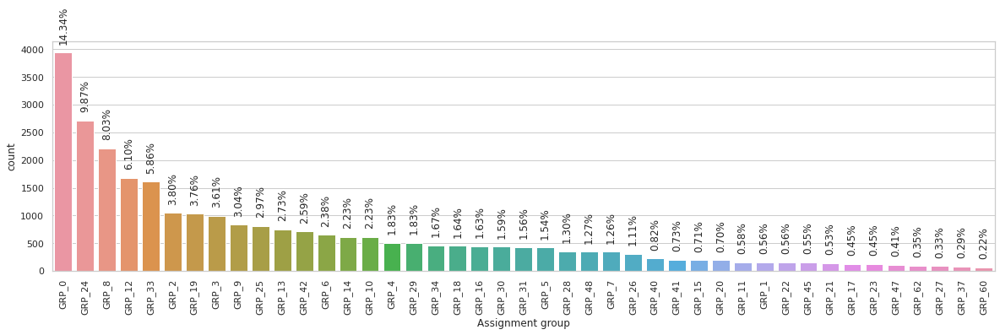

In [136]:
# Plot to visualize the percentage data distribution across different groups
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=clean_data, order=clean_data["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(clean_data.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

In [137]:
top_20 = clean_data['Assignment group'].value_counts().nlargest(20).reset_index()

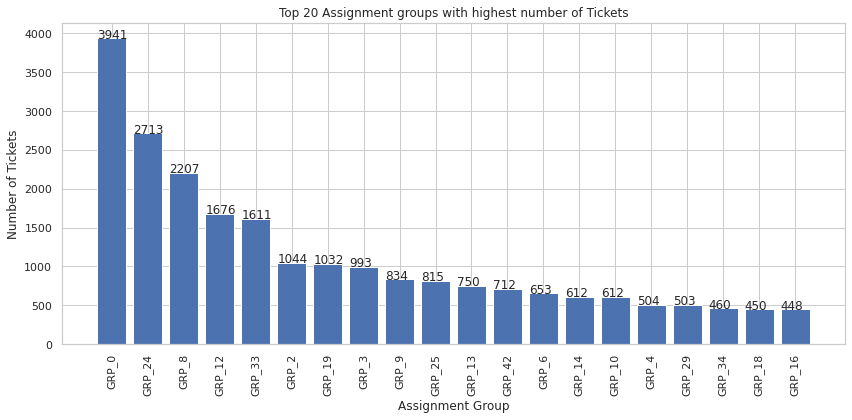

In [138]:
plt.figure(figsize=(12,6))
bars = plt.bar(top_20['index'],top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

In [139]:
bottom_20 = clean_data['Assignment group'].value_counts().nsmallest(20).reset_index()

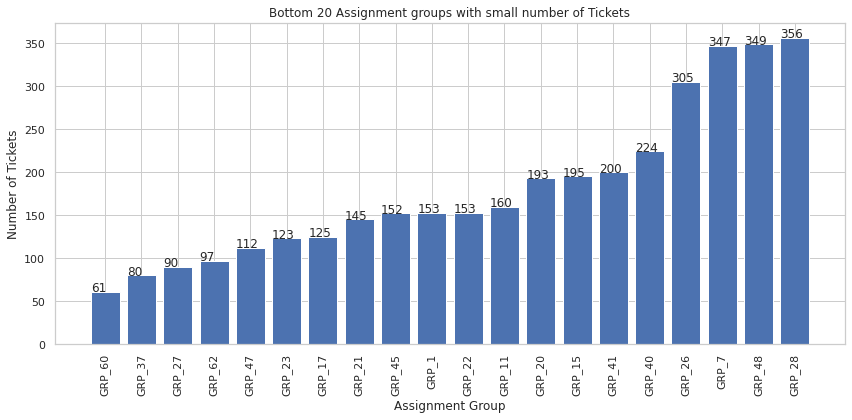

In [140]:
plt.figure(figsize=(12,6))
bars = plt.bar(bottom_20['index'],bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with small number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

#### The distribution of Callers
Plots how the callers are associated with tickets and what are the assignment groups they most frequently raise tickets for.

In [141]:
# Find out top 10 callers in terms of frequency of raising tickets in the entire dataset
print('\033[1mTotal caller count:\033[0m', clean_data['Caller'].nunique())
df = pd.DataFrame(clean_data.groupby(['Caller']).size().nlargest(10), columns=['Count']).reset_index()
df.iplot(kind='pie',
         labels='Caller', 
         values='Count', 
         title='Top 10 caller- Pie Chart (Fig-7)',
         colorscale='-spectral',
         pull=[0,0,0,0,0.05,0.1,0.15,0.2,0.25,0.3])

Total caller count: 2836


In [142]:
# Top 5 callers in each assignment group
top_n = 5
s = clean_data['Caller'].groupby(clean_data['Assignment group']).value_counts()
caller_grp = pd.DataFrame(s.groupby(level=0).nlargest(top_n).reset_index(level=0, drop=True))
caller_grp.head(15)

Caller
Assignment group Caller                   
GRP_0            fumkcsji sarmtlhy     132
                 rbozivdq gmlhrtvp      87
                 olckhmvx pcqobjnd      54
                 efbwiadp dicafxhv      45
                 mfeyouli ndobtzpw      13
GRP_1            jyoqwxhz clhxsoqy      35
                 jloygrwh acvztedi      20
                 spxqmiry zpwgoqju      15
                 bpctwhsn kzqsbmtp      12
                 kbnfxpsy gehxzayq      10
GRP_10           bpctwhsn kzqsbmtp     161
                 ihfkwzjd erbxoyqk      30
                 dizquolf hlykecxa      24
                 xfznctqa xstndbwa      24
                 byclpwmv esafrtbh      23

#### The distribution of description lengths
Plots the variation of length and word count of new description attribute

In [143]:
clean_data.insert(1, 'desc_len', clean_data['Final_Text'].astype(str).apply(len))
clean_data.insert(5, 'desc_word_count', clean_data['Final_Text'].apply(lambda x: len(str(x).split())))
clean_data.head()

,Caller,desc_len,Assignment group,language,Final_Text,desc_word_count
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,105,GRP_24,de,hello be happen the pc let go repeat time blue...,19


In [144]:
# Description text length
clean_data['desc_len'].iplot(
    kind='bar',
    xTitle='text length',
    yTitle='count',
    colorscale='-ylgn',
    title='Description Text Length Distribution (Fig-11)')

# Description word count
clean_data['desc_word_count'].iplot(
    kind='bar',
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    colorscale='-bupu',
    title='Description Word Count Distribution (Fig-12)')

### N-Grams
N-gram is a contiguous sequence of N items from a given sample of text or speech, in the fields of computational linguistics and probability. The items can be phonemes, syllables, letters, words or base pairs according to the application. N-grams are used to describe the number of words used as observation points, e.g., unigram means singly-worded, bigram means 2-worded phrase, and trigram means 3-worded phrase. 

We'll be using scikit-learn’s CountVectorizer function to derive n-grams and compare them before and after removing stop words. Stop words are a set of commonly used words in any language. We'll be using english corpus stopwords and extend it to include some business specific common words considered to be stop words in our case.

In [145]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.feature_extraction.text import CountVectorizer

# Extend the English Stop Wordss
STOP_WORDS = STOPWORDS.union({'yes','na','hi',
                              'receive','hello',
                              'regards','thanks',
                              'from','greeting',
                              'forward','reply',
                              'will','please',
                              'see','help','able'})

# Generic function to derive top N n-grams from the corpus
def get_top_n_ngrams(corpus, top_n=None, ngram_range=(1,1), stopwords=None):
    vec = CountVectorizer(ngram_range=ngram_range, 
                          stop_words=stopwords).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:top_n]

### Top Unigrams

In [146]:
# Top 50 Unigrams before removing stop words
top_n = 50
ngram_range = (1,1)
uni_grams = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range)

df = pd.DataFrame(uni_grams, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    colorscale='piyg',
    title=f'Top {top_n} Unigrams in Final_Text')

# Top 50 Unigrams after removing stop words
uni_grams_sw = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range, stopwords=STOP_WORDS)

df = pd.DataFrame(uni_grams_sw, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black',
    colorscale='-piyg',
    title=f'Top {top_n} Unigrams in Final_Text without stop words')

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.



### Top Bigrams

In [147]:
# Top 50 Bigrams before removing stop words
top_n = 50
ngram_range = (2,2)
bi_grams = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range)

df = pd.DataFrame(bi_grams, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    colorscale='piyg',
    title=f'Top {top_n} Bigrams in Final_Text')

# Top 50 Bigrams after removing stop words
bi_grams_sw = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range, stopwords=STOP_WORDS)

df = pd.DataFrame(bi_grams_sw, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black',
    colorscale='-piyg',
    title=f'Top {top_n} Bigrams in Final_Text without stop words')

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.



### Top Trigrams

In [148]:
# Top 50 Trigrams before removing stop words
top_n = 50
ngram_range = (3,3)
tri_grams = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range)

df = pd.DataFrame(tri_grams, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black', 
    colorscale='piyg',
    title=f'Top {top_n} Trigrams in Final_Text')

# Top 50 Trigrams after removing stop words
tri_grams_sw = get_top_n_ngrams(clean_data.Final_Text, top_n, ngram_range, stopwords=STOP_WORDS)

df = pd.DataFrame(tri_grams_sw, columns = ['Final_Text' , 'count'])
df.groupby('Final_Text').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', 
    yTitle='Count', 
    linecolor='black',
    colorscale='-piyg',
    title=f'Top {top_n} Trigrams in Final_Text without stop words')

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['aren', 'couldn', 'didn', 'doesn', 'don', 'hadn', 'hasn', 'haven', 'isn', 'let', 'll', 'mustn', 're', 'shan', 'shouldn', 've', 'wasn', 'weren', 'won', 'wouldn'] not in stop_words.



### Word Cloud
Let us attempt to visualize this as a word cloud for top three groups that has got maximum records. A word cloud enables us to visualize the data as cluster of words and each words displayed in different font size based on the number of occurences of that word . Basically; the bolder and bigger the word show up in the visualization, it implies its more often it’s mentioned within a given text compared to other words in the cloud and therefore would be more important for us.

Let's write a generic method to generate Word Clouds for both Short and Long Description columns.

In [149]:
# replace any single word character with a word boundary
#clean_data.Final_Text.str.replace(r'\b\w\b','').str.replace(r'\s+', ' ')

In [150]:
def generate_word_cloud(corpus):
        # Instantiate the wordcloud object
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords=STOP_WORDS,
                    # mask=mask,
                    min_font_size = 10).generate(corpus)

    # plot the WordCloud image                        
    plt.figure(figsize = (12, 12), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 

    plt.show()

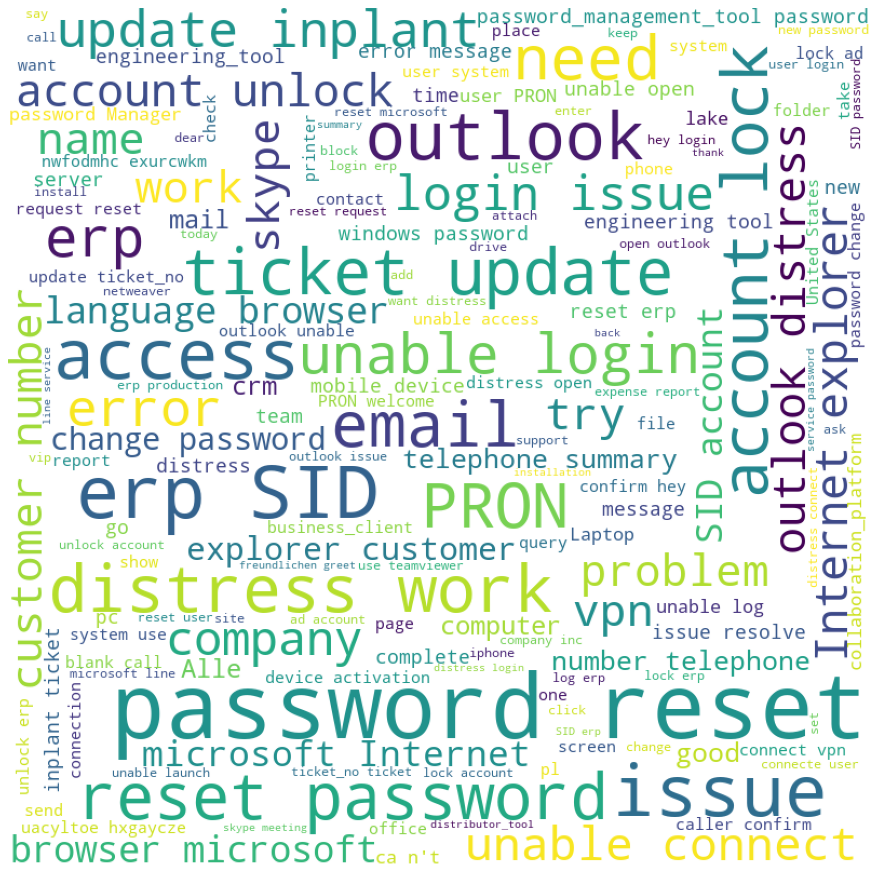

In [151]:
# Word Cloud for all tickets assigned to GRP_0
generate_word_cloud(' '.join(clean_data[clean_data['Assignment group'] == 'GRP_0'].Final_Text.str.strip()))

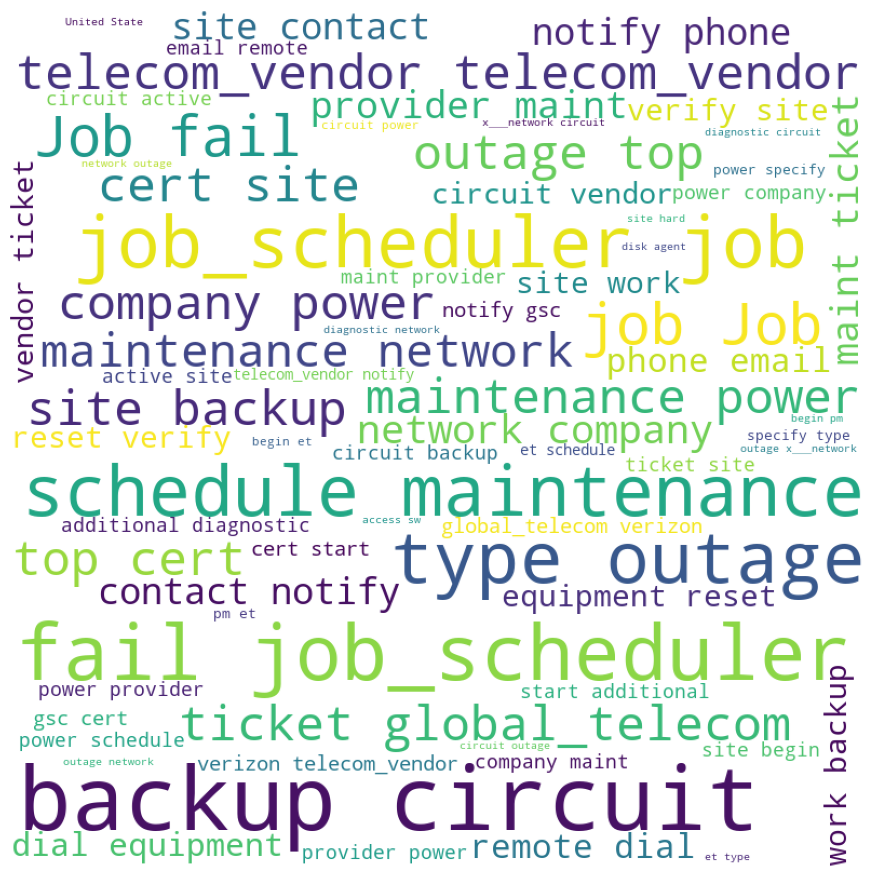

In [152]:
# Word Cloud for all tickets assigned to GRP_8
generate_word_cloud(' '.join(clean_data[clean_data['Assignment group'] == 'GRP_8'].Final_Text.str.strip()))

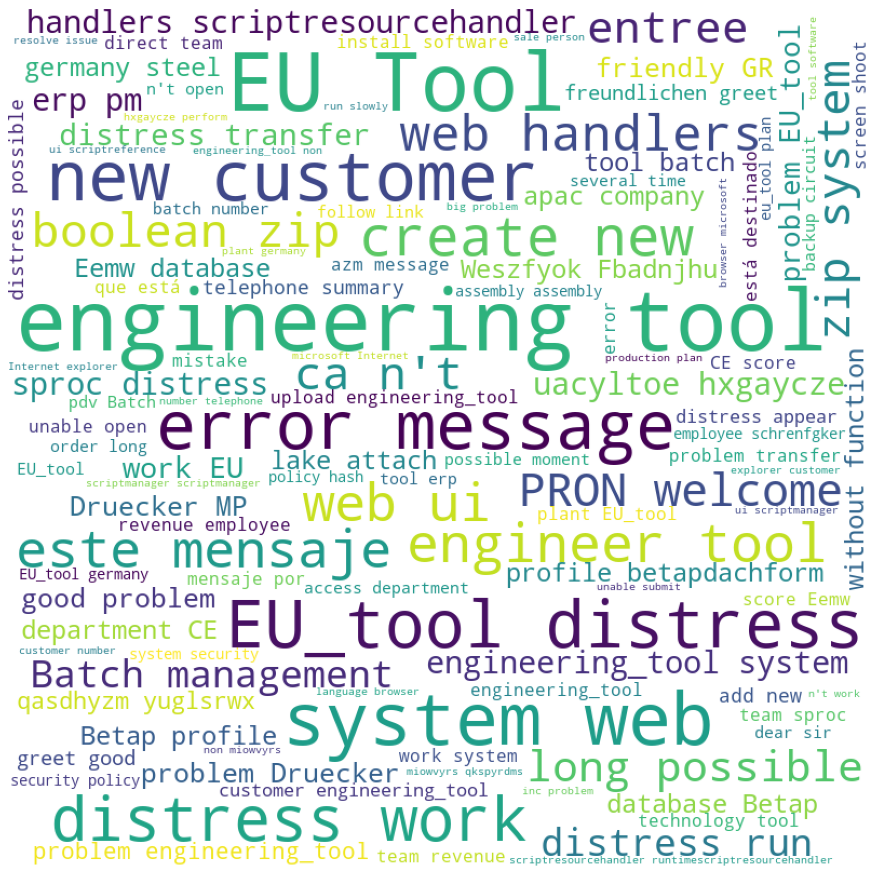

In [153]:
# Word Cloud for all tickets assigned to GRP_25
generate_word_cloud(' '.join(clean_data[clean_data['Assignment group'] == 'GRP_25'].Final_Text.str.strip()))

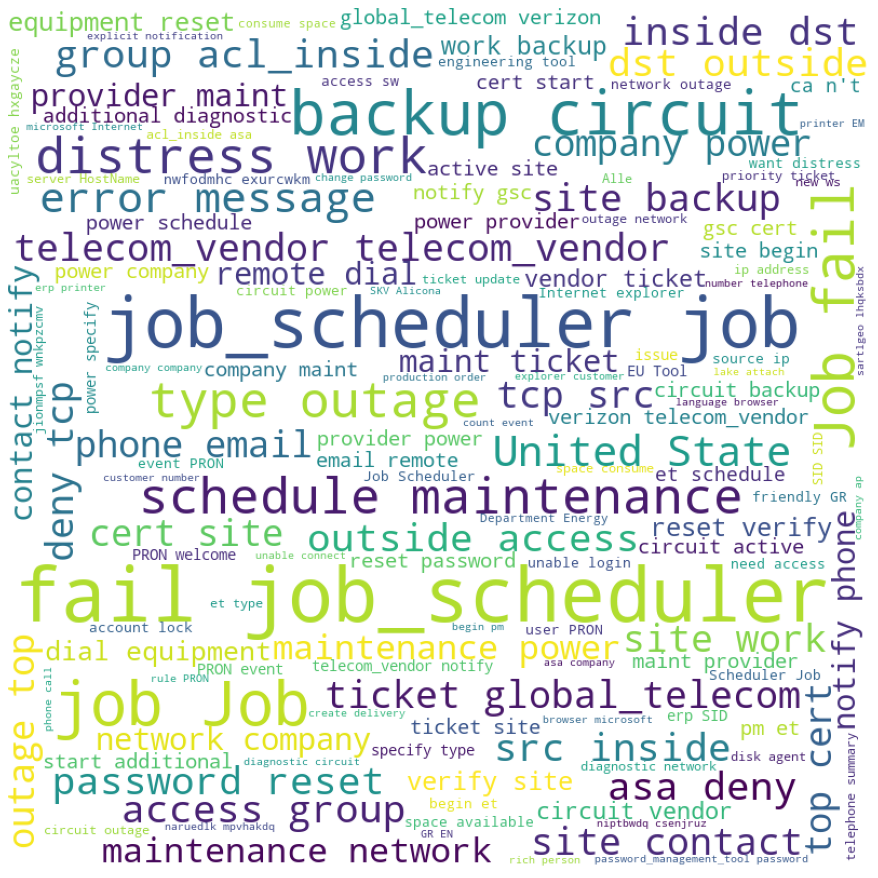

In [154]:
# Generate wordcloud for Final_Text field
generate_word_cloud(' '.join(clean_data.Final_Text.str.strip()))

# Prepping Dataframe for Model Building

In [157]:
clean_data

,Caller,desc_len,Assignment group,language,Final_Text,desc_word_count
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,106,GRP_24,de,hello be happen the pc release repeat time blu...,18
0,vrfpyjwi nzhvgqiw,105,GRP_24,de,hello be happen the pc let go repeat time blue...,19
...,...,...,...,...,...,...
87,gasbfqvp fmvqgjih,103,GRP_0,de,"on part , password incorrectly enter please pa...",15
97,nizholae bjnqikym,2028,GRP_0,de,Stephryhan need Access below Collaboration Pla...,267
100,bmhrsxlf ukatbwyi,27,GRP_0,de,benefit issue benefit issue,4
101,sjxhcyrq iupxtjcf,99,GRP_0,de,Security Error travel expense Billing ProgramD...,12


In [158]:
# Import label encoder 
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
  
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'species'. 
clean_data['Assignment group LabelEncoded']= label_encoder.fit_transform(clean_data['Assignment group']) 

target_strings = label_encoder.inverse_transform(clean_data['Assignment group LabelEncoded'])
target_strings_list = np.unique(target_strings).tolist()
clean_data['Assignment group LabelEncoded']

array([17, 25, 18,  4, 35, 26, 24, 32, 21,  1,  8, 12, 27, 13,  6, 23,  2,
       22, 29,  5, 42, 36, 19, 34, 37, 40, 41, 10,  3,  7,  9, 11, 14, 15,
       16, 20, 28, 30, 31, 33, 38, 39,  0])

In [159]:
label_encoded_dict = dict(zip(clean_data['Assignment group'].unique(), clean_data['Assignment group LabelEncoded'].unique()))
label_encoded_dict

43

# Using 2 methods for feature extraction

## Feature Extraction : Using TFIDF vectors

In [ ]:
# Splitting Train Test with stratify parameter
from sklearn.model_selection import train_test_split

X_train1, X_test1, y_train1, y_test1 = train_test_split(clean_data['Final_Text'], clean_data['Assignment group LabelEncoded'], test_size=0.3, random_state = 0, stratify=clean_data['Assignment group LabelEncoded'])
print('\033[1mShape of the training set:\033[0m', X_train.shape, X_test.shape)
print('\033[1mShape of the test set:\033[0m', y_train1.shape, y_test1.shape)

In [ ]:
#Using first method of TFIDF vectors feature extraction
Tfidf_vect = TfidfVectorizer(max_features=2500)
Tfidf_vect.fit(clean_data.Final_Text.astype(str))
X_train_tfidf = Tfidf_vect.transform(X_train1)
X_test_tfidf = Tfidf_vect.transform(X_test1)

## Feature Extraction : Bag of Words using CountVectorizer

In [160]:
from sklearn.feature_extraction.text import CountVectorizer

CV = CountVectorizer(max_features=2500)

X_BoW = CV.fit_transform(clean_data['Final_Text']).toarray()
y = clean_data['Assignment group LabelEncoded']

print("Shape of Input Feature :",np.shape(X_BoW))
print("Shape of Target Feature :",np.shape(y))

Shape of Input Feature : (27478, 2000)
Shape of Target Feature : (27478,)


In [161]:
# Splitting Train Test 
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_BoW, y, test_size=0.3, random_state = 0, stratify=y)
print('\033[1mShape of the training set:\033[0m', X_train.shape, X_test.shape)
print('\033[1mShape of the test set:\033[0m', y_train.shape, y_test.shape)

Shape of the training set: (19234, 2000) (8244, 2000)
Shape of the test set: (19234,) (8244,)


# Writing a common function to train, predict and visualize the model output

In [162]:
def run_classification(estimator, X_train, X_test, y_train, y_test, arch_name=None, pipelineRequired=True, isDeepModel=False):
    # train the model
    clf = estimator

    if pipelineRequired :
        clf = Pipeline([('tfidf', TfidfTransformer()),
                     ('clf', estimator),
                     ])
      
    if isDeepModel :
        clf.fit(X_train, y_train, validation_data=(X_test, y_test),epochs=25, batch_size=128,verbose=1,callbacks=call_backs(arch_name))
        # predict from the clasiffier
        y_pred = clf.predict(X_test)
        y_pred = np.argmax(y_pred, axis=1)
        y_train_pred = clf.predict(X_train)
        y_train_pred = np.argmax(y_train_pred, axis=1)
    else :
        clf.fit(X_train, y_train)
        # predict from the clasiffier
        y_pred = clf.predict(X_test)
        y_train_pred = clf.predict(X_train)
    
    print('Estimator:', clf)
    print('='*80)
    print('Training accuracy: %.2f%%' % (accuracy_score(y_train,y_train_pred) * 100))
    print('Testing accuracy: %.2f%%' % (accuracy_score(y_test, y_pred) * 100))
    print('='*80)
    print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
    print('='*80)
    print('Classification report:\n %s' % (classification_report(y_test, y_pred)))
    

# Machine Learning models - Hyperparamater tuning and model training/predict

## Logistic Regression

In [ ]:
run_classification(LogisticRegression(), X_train, X_test, y_train, y_test)

In [12]:
# Create param grid.
param = [{'penalty' : ['l1','l2'], 'C' : [0.5,1,5,7], 'solver' : ['liblinear','lbfgs']}]

# Create random search object
rs_lr = RandomizedSearchCV(LogisticRegression(max_iter=100), param_distributions = param, cv = 3, verbose=True, n_jobs=-1)
rs_lr_results = rs_lr.fit(X_train,y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  3.4min finished


In [13]:
rs_lr.best_params_

{'solver': 'lbfgs', 'penalty': 'l2', 'C': 5}

In [14]:
rs_lr.best_estimator_

LogisticRegression(C=5)

In [15]:
lr_clf = rs_lr.best_estimator_
run_classification(lr_clf,X_train,X_test, y_train,y_test)

Estimator: Pipeline(steps=[('tfidf', TfidfTransformer()),
                ('clf', LogisticRegression(C=5))])
Training accuracy: 95.37%
Testing accuracy: 89.50%
Confusion matrix:
 [[ 727    0    1 ...    0    6    0]
 [   0  137    0 ...    0    0    0]
 [   1    0  144 ...    0    1    0]
 ...
 [   1    3    0 ...  404    1   14]
 [   5    0    0 ...    0  129    9]
 [   3    0    0 ...    2    1 1418]]
Classification report:
               precision    recall  f1-score   support

           0       0.71      0.76      0.74       957
           1       0.93      0.91      0.92       150
           2       0.92      0.96      0.94       150
           3       0.96      0.99      0.98       150
           4       0.84      0.85      0.85       426
           5       0.89      0.90      0.90       254
           6       0.87      0.78      0.82       206
           7       0.97      0.98      0.97       150
           8       0.85      0.84      0.85       153
           9       0.95     

## Naive Bayes Classifier

In [16]:
params ={'alpha':[0,0.5,1,2.5],'fit_prior':['True','False']}
rs_mnb = RandomizedSearchCV(MultinomialNB(),params,cv=3)
rs_mnb_results = rs_mnb.fit(X_train,y_train)

In [17]:
rs_mnb.best_estimator_

MultinomialNB(alpha=0, fit_prior='True')

In [18]:
rs_mnb.best_params_

{'fit_prior': 'True', 'alpha': 0}

In [19]:
mnb_clf= rs_mnb.best_estimator_
run_classification(mnb_clf,X_train,X_test,y_train,y_test)

Estimator: Pipeline(steps=[('tfidf', TfidfTransformer()),
                ('clf', MultinomialNB(alpha=0, fit_prior='True'))])
Training accuracy: 90.31%
Testing accuracy: 81.10%
Confusion matrix:
 [[ 758    0    0 ...    2    2    2]
 [   3  135    0 ...    0    0    2]
 [   2    0  120 ...    0    0    2]
 ...
 [   6    6    0 ...  357    0   24]
 [  13    0    0 ...    0   99   16]
 [   4    0    1 ...    2    1 1408]]
Classification report:
               precision    recall  f1-score   support

           0       0.52      0.79      0.63       957
           1       0.91      0.90      0.91       150
           2       0.87      0.80      0.83       150
           3       0.90      0.93      0.91       150
           4       0.60      0.72      0.65       426
           5       0.70      0.85      0.77       254
           6       0.68      0.60      0.64       206
           7       0.96      0.91      0.94       150
           8       0.78      0.59      0.67       153
           

## K-nearest Neighbor

#### Applying Gridsearch to find Best Parameters

In [20]:
# param = {'n_neighbors': [3,5,7], 'weights': ['uniform', 'distance'], 'metric': ['euclidean', 'manhattan']} --> Gave best param n_neighbours -3,istance, mahattan
param = {'n_neighbors': [2,3], 'weights': ['uniform', 'distance'], 'metric': ['euclidean', 'manhattan']}
gs_knn = GridSearchCV(KNeighborsClassifier(), param, verbose = 1, cv = 3, n_jobs = -1)
gs_knn_results = gs_knn.fit(X_train, y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed: 40.5min finished


In [21]:
gs_knn_results.best_score_

0.8928138528138528

In [22]:
gs_knn.best_estimator_

KNeighborsClassifier(metric='euclidean', n_neighbors=2, weights='distance')

In [23]:
gs_knn.best_params_

{'metric': 'euclidean', 'n_neighbors': 2, 'weights': 'distance'}

In [24]:
knn_clf = gs_knn.best_estimator_

run_classification(knn_clf, X_train, X_test, y_train, y_test)

Estimator: Pipeline(steps=[('tfidf', TfidfTransformer()),
                ('clf',
                 KNeighborsClassifier(metric='euclidean', n_neighbors=2,
                                      weights='distance'))])
Training accuracy: 99.74%
Testing accuracy: 92.88%
Confusion matrix:
 [[ 612    0    2 ...    3    4    0]
 [   0  148    0 ...    0    0    0]
 [   0    0  145 ...    0    0    0]
 ...
 [   1    1    1 ...  411    1   20]
 [   1    0    0 ...    1  139    4]
 [   1    0    3 ...    3    2 1399]]
Classification report:
               precision    recall  f1-score   support

           0       0.86      0.64      0.73       957
           1       0.95      0.99      0.97       150
           2       0.95      0.97      0.96       150
           3       1.00      0.99      1.00       150
           4       0.94      0.89      0.92       426
           5       0.97      0.95      0.96       254
           6       0.97      0.91      0.94       206
           7       0.99      

In [ ]:
#run_classification(KNeighborsClassifier(), X_train, X_test, y_train, y_test)

## Support Vector Machine (SVM)

#### Applying Gridsearch to find Best Parameters

In [25]:
model = SVC()
#param = {'C':[0.01, 0.5,1],'kernel':['linear','rbf']} --> Gave best estimator as C= 1 and Kernel = linear
param = {'C':[1,2.5],'kernel':['linear','rbf']}
gs_svm = GridSearchCV (model,param_grid=param, cv=3,scoring ='accuracy')
gs_svm_results = gs_svm.fit(X_train,y_train)

In [26]:
gs_svm_results.best_score_

0.8820779220779221

In [27]:
gs_svm.best_estimator_

SVC(C=1, kernel='linear')

In [28]:
gs_svm.best_params_

{'C': 1, 'kernel': 'linear'}

In [29]:
svc_clf = gs_svm.best_estimator_

run_classification(svc_clf, X_train, X_test, y_train, y_test)

Estimator: Pipeline(steps=[('tfidf', TfidfTransformer()),
                ('clf', SVC(C=1, kernel='linear'))])
Training accuracy: 94.16%
Testing accuracy: 89.13%
Confusion matrix:
 [[ 763    0    1 ...    0    6    0]
 [   0  138    0 ...    0    0    0]
 [   2    0  143 ...    0    1    2]
 ...
 [   5    2    0 ...  396    0   20]
 [   8    0    0 ...    0  124   13]
 [   1    0    0 ...    0    0 1421]]
Classification report:
               precision    recall  f1-score   support

           0       0.64      0.80      0.71       957
           1       0.97      0.92      0.94       150
           2       0.95      0.95      0.95       150
           3       0.98      0.97      0.98       150
           4       0.80      0.85      0.82       426
           5       0.92      0.92      0.92       254
           6       0.88      0.83      0.85       206
           7       1.00      0.98      0.99       150
           8       0.84      0.86      0.85       153
           9       0.94   

## Decision Tree

In [30]:
#Using GRIDSearch CV to find hyper parameters

#params = {'criterion': ['entropy', 'gini'], 'max_depth': [None,3,4,5,9,10 ],            
#               'min_samples_leaf': [ 2, 3, 5,7, 10,20]}

params = {'criterion': ['entropy', 'gini'],'min_samples_leaf': [ 2, 3, 5,7, 10,20]}
DTreg = DecisionTreeClassifier()
gs_DT = GridSearchCV(estimator = DTreg,
                           param_grid = params,
                           scoring = 'accuracy',
                           cv = 3,)
gs_DT_results = gs_DT.fit(X_train, y_train)


In [31]:
#Using GRIDSearch CV to find hyper parameters

gs_DT_results.best_score_

0.7982337662337663

In [32]:
gs_DT.best_params_

{'criterion': 'gini', 'min_samples_leaf': 2}

In [33]:
gs_DT.best_estimator_

DecisionTreeClassifier(min_samples_leaf=2)

In [34]:
DT_clf = gs_DT.best_estimator_

In [35]:
run_classification(DT_clf,X_train, X_test, y_train, y_test)

Estimator: Pipeline(steps=[('tfidf', TfidfTransformer()),
                ('clf', DecisionTreeClassifier(min_samples_leaf=2))])
Training accuracy: 95.60%
Testing accuracy: 83.35%
Confusion matrix:
 [[ 601    1    7 ...    3    6    0]
 [   0  144    0 ...    0    0    2]
 [   8    0  121 ...    0    0    0]
 ...
 [   6    6    0 ...  365    1   13]
 [   8    0    1 ...    5  105    2]
 [   2    2    0 ...    4    2 1408]]
Classification report:
               precision    recall  f1-score   support

           0       0.53      0.63      0.57       957
           1       0.89      0.96      0.92       150
           2       0.75      0.81      0.78       150
           3       0.83      0.89      0.86       150
           4       0.75      0.75      0.75       426
           5       0.74      0.73      0.74       254
           6       0.76      0.71      0.73       206
           7       0.91      0.93      0.92       150
           8       0.65      0.73      0.69       153
         

In [ ]:
#run_classification(DecisionTreeClassifier(), X_train, X_test, y_train, y_test)

## Random Forest

In [36]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

In [37]:
#Using RandomizedSearchCV (GRIDSearch is taing longer) to find hyper parameters

#params = {'n_estimators': [75, 100, 250,500], 'max_depth': [3,5,10,15,25]}
params = {'n_estimators': [75,100,250], 'criterion': ['gini','entropy']}
rfc = RandomForestClassifier()
rs_rfc = RandomizedSearchCV(estimator = rfc,
                           param_distributions = params,
                           cv = 3,random_state = 42, n_jobs = 1, return_train_score= True)
rs_rfc_results = rs_rfc.fit(X_train, y_train)


In [38]:
rs_rfc_results.best_score_

0.9077056277056278

In [39]:
rs_rfc.best_params_

{'n_estimators': 250, 'criterion': 'gini'}

In [40]:
rs_rfc.best_estimator_

RandomForestClassifier(n_estimators=250)

In [41]:
rfc_clf = rs_rfc.best_estimator_

In [42]:
run_classification(rfc_clf, X_train, X_test, y_train, y_test)

Estimator: Pipeline(steps=[('tfidf', TfidfTransformer()),
                ('clf', RandomForestClassifier(n_estimators=250))])
Training accuracy: 99.80%
Testing accuracy: 93.43%
Confusion matrix:
 [[ 781    0    0 ...    2    5    1]
 [   0  148    0 ...    0    0    2]
 [   4    0  144 ...    0    0    0]
 ...
 [   0    1    0 ...  410    0   24]
 [   6    0    0 ...    0  136    5]
 [   0    0    0 ...    0    0 1427]]
Classification report:
               precision    recall  f1-score   support

           0       0.75      0.82      0.78       957
           1       0.99      0.99      0.99       150
           2       0.99      0.96      0.98       150
           3       1.00      1.00      1.00       150
           4       0.86      0.93      0.89       426
           5       0.96      0.93      0.94       254
           6       0.96      0.86      0.91       206
           7       0.99      0.98      0.99       150
           8       0.88      0.92      0.90       153
           

In [ ]:
#run_classification(RandomForestClassifier(n_estimators=100, random_state=0), X_train, X_test, y_train, y_test)

## GradientBoosting

In [43]:
from sklearn.ensemble import GradientBoostingClassifier
#run_classification(GradientBoostingClassifier(n_estimators=100, random_state=0), X_train, X_test, y_train, y_test)

In [44]:
params ={'max_depth':[3,5,10,15],'n_estimators':[5,10,30,50,100]}

In [ ]:
gbc = GradientBoostingClassifier(n_estimators=100, random_state=42)
rs_gbc = RandomizedSearchCV(estimator = gbc,
                           param_distributions = params,
                           cv = 3,random_state = 42, n_jobs = 1, return_train_score= True)
#Fitting randomsearch model
rs_gbc_results = rs_gbc.fit(X_train, y_train)

In [ ]:
rs_gbc_results.best_score_

In [ ]:
rs_gbc.best_params_

In [ ]:
rs_gbc.best_estimator_

In [ ]:
gbc_clf = rs_gbc.best_estimator_

In [ ]:
run_classification(gbc_clf, X_train, X_test, y_train, y_test)

## XGBoosting

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBClassifier
#run_classification(XGBClassifier(), X_train, X_test, y_train, y_test)

In [ ]:
params ={'max_depth':[3,5,10,15],'n_estimators':[5,10,30,50,100]}

In [ ]:
xgbc = XGBClassifier(class_weight ='balanced', n_jobs=1)
rs_xgbc = RandomizedSearchCV(estimator = xgbc,
                           param_distributions = params,
                           cv = 3,random_state = 42, n_jobs = 1, return_train_score= True)
#Fitting randomsearch model
rs_xgbc_results = rs_xgbc.fit(X_train, y_train)

In [ ]:
rs_xgbc_results.best_score_

In [ ]:
rs_xgbc.best_params_

In [ ]:
rs_xgbc.best_estimator_

In [ ]:
xgbc_clf = rs_xgbc.best_estimator_

In [ ]:
run_classification(xgbc_clf, X_train, X_test, y_train, y_test)

## Bagging

In [ ]:
from sklearn.ensemble import BaggingClassifier
#run_classification(BaggingClassifier(n_estimators=10, random_state=0), X_train, X_test, y_train, y_test)

In [ ]:
params ={'n_estimators':[5,10,30,50,100],'random_state' :[1,10,20]}
#params ={'n_estimators' :[5,10,30,50,100], 'max_features':[1,10,20]} -> n_estimators =10; max features =20

?BaggingClassifier

In [ ]:
bgc = BaggingClassifier()
rs_bgc = RandomizedSearchCV(estimator = bgc,
                           param_distributions = params,
                           cv = 3, n_jobs = 1, return_train_score= True)
#Fitting randomsearch model
rs_bgc_results = rs_bgc.fit(X_train, y_train)

In [ ]:
rs_bgc_results.best_score_

In [ ]:
rs_bgc.best_params_

In [ ]:
rs_bgc.best_estimator_

In [ ]:
bgc_clf = rs_bgc.best_estimator_

In [ ]:
run_classification(bgc_clf, X_train, X_test, y_train, y_test)

# Running models with both tfdif feature dataset as well to check for accuracy

## Logistic Regression

In [ ]:
run_classification(LogisticRegression(C=5, penalty='l2', solver='lbfgs'), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## Naive Bayes Classifier

In [ ]:
run_classification(MultinomialNB(alpha=0, fit_prior='True'), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## K-nearest Neighbor

In [ ]:
run_classification(KNeighborsClassifier(metric='euclidean', n_neighbors=2, weights='distance'), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## Support Vector Machine (SVM)

In [ ]:
run_classification(LinearSVC(C=1), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## Decision Tree

In [ ]:
run_classification(DecisionTreeClassifier(criterion='gini', min_samples_leaf=2), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## Random Forest

In [ ]:
run_classification(RandomForestClassifier(criterion= 'gini', n_estimators=250), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## GradientBoosting

In [ ]:
run_classification(GradientBoostingClassifier(max_depth=15, n_estimators=50, random_state=42), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## XGBoosting

In [ ]:
run_classification(XGBClassifier(n_estimators=50, max_depth=15), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## Bagging

In [ ]:
run_classification(BaggingClassifier(n_estimators=100, random_state=10), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## Stacking

In [ ]:
estimators = [('rf', RandomForestClassifier(n_estimators=100, random_state=42)), ('svr', make_pipeline(StandardScaler(with_mean=False), LinearSVC(random_state=42)))]

run_classification(StackingClassifier(estimators=estimators, final_estimator=DecisionTreeClassifier()), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

## Voting

In [ ]:
estimators = [('rf', RandomForestClassifier(criterion= 'entropy', n_estimators=100, random_state=42)), ('knn', KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=None, n_neighbors=2, p=2,
                     weights='distance')), ('bg', BaggingClassifier(n_estimators=100, random_state=42)), ('lsvc', LinearSVC(C=1, random_state=42))]

run_classification(VotingClassifier(estimators=estimators, voting='hard'), X_train_tfidf, X_test_tfidf, y_train1, y_test1)

# 

# Deep Neural Networks 

In [42]:
# Load the augmented data from pickle file 
with open('/content/drive/MyDrive/Capstone/Interim_data.pkl','rb') as f:
#with open('Interim_data.pkl','rb') as f:
    clean_data_DL = pickle.load(f)

## Prepping the dataframe similar to what we did for ML models - Creating new target group for monitoring tool email text and resampling groups with less than 500 records

In [6]:
clean_data_DL.loc[(clean_data_DL['Final_Text'].astype(str).str.contains('scheduler')), 'Assignment group'] = "GRP_MonitoringTool"


In [7]:
temp_dataframe3 = clean_data_DL[(clean_data_DL["Assignment group"] == 'GRP_43') | (clean_data_DL["Assignment group"] == 'GRP_46') | (clean_data_DL["Assignment group"] == 'GRP_59') | (clean_data_DL["Assignment group"] == 'GRP_49') | (clean_data_DL["Assignment group"] == 'GRP_60') | (clean_data_DL["Assignment group"] == 'GRP_51') | (clean_data_DL["Assignment group"] == 'GRP_52') | (clean_data_DL["Assignment group"] == 'GRP_65') | (clean_data_DL["Assignment group"] == 'GRP_53') | (clean_data_DL["Assignment group"] == 'GRP_39') | (clean_data_DL["Assignment group"] == 'GRP_36') | (clean_data_DL["Assignment group"] == 'GRP_50') | (clean_data_DL["Assignment group"] == 'GRP_44') | (clean_data_DL["Assignment group"] == 'GRP_47') | (clean_data_DL["Assignment group"] == 'GRP_37') | (clean_data_DL["Assignment group"] == 'GRP_27') | (clean_data_DL["Assignment group"] == 'GRP_5') | (clean_data_DL["Assignment group"] == 'GRP_1') | (clean_data_DL["Assignment group"] == 'GRP_62') | (clean_data_DL["Assignment group"] == 'GRP_23') | (clean_data_DL["Assignment group"] == 'GRP_17') | (clean_data_DL["Assignment group"] == 'GRP_48') | (clean_data_DL["Assignment group"] == 'GRP_45') | (clean_data_DL["Assignment group"] == 'GRP_21') | (clean_data_DL["Assignment group"] == 'GRP_11') | (clean_data_DL["Assignment group"] == 'GRP_22') | (clean_data_DL["Assignment group"] == 'GRP_20') | (clean_data_DL["Assignment group"] == 'GRP_42') | (clean_data_DL["Assignment group"] == 'GRP_30') | (clean_data_DL["Assignment group"] == 'GRP_15') | (clean_data_DL["Assignment group"] == 'GRP_41') | (clean_data_DL["Assignment group"] == 'GRP_28') | (clean_data_DL["Assignment group"] == 'GRP_40') | (clean_data_DL["Assignment group"] == 'GRP_26') | (clean_data_DL["Assignment group"] == 'GRP_34') | (clean_data_DL["Assignment group"] == 'GRP_6') | (clean_data_DL["Assignment group"] == 'GRP_7') | (clean_data_DL["Assignment group"] == 'GRP_31') | (clean_data_DL["Assignment group"] == 'GRP_9') | (clean_data_DL["Assignment group"] == 'GRP_10')]
temp_dataframe4 = clean_data_DL[(clean_data_DL["Assignment group"] != 'GRP_43') & (clean_data_DL["Assignment group"] != 'GRP_46') & (clean_data_DL["Assignment group"] != 'GRP_59') & (clean_data_DL["Assignment group"] != 'GRP_49') & (clean_data_DL["Assignment group"] != 'GRP_60') & (clean_data_DL["Assignment group"] != 'GRP_51') & (clean_data_DL["Assignment group"] != 'GRP_52') & (clean_data_DL["Assignment group"] != 'GRP_65') & (clean_data_DL["Assignment group"] != 'GRP_53') & (clean_data_DL["Assignment group"] != 'GRP_39') & (clean_data_DL["Assignment group"] != 'GRP_36') & (clean_data_DL["Assignment group"] != 'GRP_50') & (clean_data_DL["Assignment group"] != 'GRP_44') & (clean_data_DL["Assignment group"] != 'GRP_47') & (clean_data_DL["Assignment group"] != 'GRP_37') & (clean_data_DL["Assignment group"] != 'GRP_27') & (clean_data_DL["Assignment group"] != 'GRP_5') & (clean_data_DL["Assignment group"] != 'GRP_1') & (clean_data_DL["Assignment group"] != 'GRP_62') & (clean_data_DL["Assignment group"] != 'GRP_23') & (clean_data_DL["Assignment group"] != 'GRP_17') & (clean_data_DL["Assignment group"] != 'GRP_48') & (clean_data_DL["Assignment group"] != 'GRP_45') & (clean_data_DL["Assignment group"] != 'GRP_21') & (clean_data_DL["Assignment group"] != 'GRP_11') & (clean_data_DL["Assignment group"] != 'GRP_22') & (clean_data_DL["Assignment group"] != 'GRP_20') & (clean_data_DL["Assignment group"] != 'GRP_42') & (clean_data_DL["Assignment group"] != 'GRP_30') & (clean_data_DL["Assignment group"] != 'GRP_15') & (clean_data_DL["Assignment group"] != 'GRP_41') & (clean_data_DL["Assignment group"] != 'GRP_28') & (clean_data_DL["Assignment group"] != 'GRP_40') & (clean_data_DL["Assignment group"] != 'GRP_26') & (clean_data_DL["Assignment group"] != 'GRP_34') & (clean_data_DL["Assignment group"] != 'GRP_6') & (clean_data_DL["Assignment group"] != 'GRP_7') & (clean_data_DL["Assignment group"] != 'GRP_31') & (clean_data_DL["Assignment group"] != 'GRP_9') & (clean_data_DL["Assignment group"] != 'GRP_10')]
temp_dataframe4

,Caller,Assignment group,language,Final_Text
17,sigfdwcj reofwzlm,GRP_3,en,"though undocking interface, screen will not sa..."
31,kxsceyzo naokumlb,GRP_4,en,"gentles, have two devices that are trying to s..."
46,bpctwhsn kzqsbmtp,GRP_MonitoringTool,en,job Job_ had in job_scheduler last: needs Job_...
49,bpctwhsn kzqsbmtp,GRP_MonitoringTool,en,getting mm_zscr_dly_merktc failed in job_sched...
58,bpctwhsn kzqsbmtp,GRP_MonitoringTool,en,job mm_zscr_dly_merktc when and job_scheduler ...
...,...,...,...,...
8183,hugcadrn ixhlwdgt,GRP_2,en,please remove user hugcadrn ixhlwdgt (ralfteim...
8186,pvbomqht smfkuhwi,GRP_3,en,pc received multiple windows security updates ...
8189,mpihysnw wrctgoan,GRP_29,en,please contact ed pasgryowski (pasgryo) about ...
8193,cpmaidhj elbaqmtp,GRP_3,en,tablet needs reimaged due to multiple issues w...


In [8]:
from sklearn.utils import resample
clean_data_resampled2 = temp_dataframe3[0:0]
for grp in temp_dataframe3['Assignment group'].unique():
    temp_dataframe5 = temp_dataframe3.apply(lambda x : True
            if str(temp_dataframe3['Assignment group']) == grp else False, axis = 1)
    num_rows2 = len(temp_dataframe5[temp_dataframe5 == True].index) 
    if(num_rows2 < 500):
            temp_dataframeGrpDF1 = temp_dataframe3[temp_dataframe3['Assignment group'] == grp]
            resampled2 = resample(temp_dataframeGrpDF1, replace=True, n_samples=500, random_state=123)
            clean_data_resampled2 = clean_data_resampled2.append(resampled2)

In [9]:
dataframes=[clean_data_resampled2, temp_dataframe4]
clean_data_DL = pd.concat(dataframes)
clean_data_DL

,Caller,Assignment group,language,Final_Text
3574,spxqmiry zpwgoqju,GRP_1,en,HostName_: volume: / dev / ora_data encourages...
1590,jyoqwxhz clhxsoqy,GRP_1,en,HostName_: volume: /dev/SID_ora on server: Hos...
4783,pvlxjizg xzvlwqjc,GRP_1,en,hostname _ and hostname _ in listener is not a...
541,kbnfxpsy gehxzayq,GRP_1,en,considering ticket_no which corresponded fixed...
4454,mnlazfsr mtqrkhnx,GRP_1,en,'s shop_floor_app is intelligence: inaccessibl...
...,...,...,...,...
8183,hugcadrn ixhlwdgt,GRP_2,en,please remove user hugcadrn ixhlwdgt (ralfteim...
8186,pvbomqht smfkuhwi,GRP_3,en,pc received multiple windows security updates ...
8189,mpihysnw wrctgoan,GRP_29,en,please contact ed pasgryowski (pasgryo) about ...
8193,cpmaidhj elbaqmtp,GRP_3,en,tablet needs reimaged due to multiple issues w...


In [10]:
clean_data_DL.to_csv('Interim_data_resampled.csv', index=False, encoding='utf_8_sig')
#with open('/content/Final_data.pkl','wb') as f:
with open('/content/drive/MyDrive/Capstone/Interim_data_resampled.pkl','wb') as f:
    pickle.dump(clean_data_DL, f, pickle.HIGHEST_PROTOCOL)

# Start from here to save time while DL model training

In [ ]:
# Load the augmented data from pickle file 
with open('/content/drive/MyDrive/Capstone/Interim_data_resampled.pkl','rb') as f:
#with open('Interim_data.pkl','rb') as f:
    clean_data_DL = pickle.load(f)

In [45]:
clean_data_DL.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41252 entries, 3574 to 8194
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Caller            41252 non-null  object
 1   Assignment group  41252 non-null  object
 2   language          41252 non-null  object
 3   Final_Text        41252 non-null  object
dtypes: object(4)
memory usage: 1.6+ MB


In [46]:
# Import label encoder 
from sklearn import preprocessing 
  
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'species'. 
clean_data_DL['Assignment group LabelEncoded']= label_encoder.fit_transform(clean_data_DL['Assignment group']) 

target_strings = label_encoder.inverse_transform(clean_data_DL['Assignment group LabelEncoded'])
target_strings_list = np.unique(target_strings).tolist()

clean_data_DL['Assignment group LabelEncoded'].unique()

array([ 1, 42, 52, 48,  3,  7,  9, 13, 14, 15, 16, 19, 20, 21, 54, 24, 25,
        2, 27, 28, 29, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44,
       45, 46, 47, 49, 50, 51, 23, 31, 55, 53,  4,  6,  8, 10, 11, 12, 17,
        5, 22, 18, 26,  0])

In [47]:
label_encoded_dict = dict(zip(clean_data_DL['Assignment group'].unique(), clean_data_DL['Assignment group LabelEncoded'].unique()))
len(label_encoded_dict)

56

In [48]:
# Splitting Train Test with stratify parameter
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(clean_data_DL['Final_Text'], clean_data_DL['Assignment group LabelEncoded'], test_size=0.3, random_state = 0, stratify=clean_data_DL['Assignment group LabelEncoded'])
print('\033[1mShape of the training set:\033[0m', X_train.shape, X_test.shape)
print('\033[1mShape of the test set:\033[0m', y_train.shape, y_test.shape)

Shape of the training set: (28876,) (12376,)
Shape of the test set: (28876,) (12376,)


### Create checkpoints function

In [49]:
#Path where you want to save the weights, model and checkpoints
model_path = "Weights/"
%mkdir Weights

# Define model callbacks
def call_backs(name):
    early_stopping = EarlyStopping(monitor='val_loss', mode='min', min_delta=0.01, patience=3)
    model_checkpoint =  ModelCheckpoint(model_path + name + '_epoch{epoch:02d}_loss{val_loss:.4f}.h5',
                                                               monitor='val_loss',
                                                               verbose=1,
                                                               save_best_only=True,
                                                               save_weights_only=False,
                                                               mode='min',
                                                               period=1)
    return [model_checkpoint, early_stopping]

mkdir: cannot create directory ‘Weights’: File exists


## Deep Neural Networks (DNN)

In [17]:
# Function to build Neural Network
def Build_Model_DNN_Text(shape, nClasses, dropout=0.3):
    """
    buildModel_DNN_Tex(shape, nClasses,dropout)
    Build Deep neural networks Model for text classification
    Shape is input feature space
    nClasses is number of classes
    """
    model = Sequential()
    node = 512 # number of nodes
    nLayers = 4 # number of  hidden layer
    model.add(Dense(node,input_dim=shape,activation='relu'))
    model.add(Dropout(dropout))
    for i in range(0,nLayers):
        model.add(Dense(node,input_dim=node,activation='relu'))
        model.add(Dropout(dropout))
        model.add(BatchNormalization())
    model.add(Dense(nClasses, activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
    print(model.summary())
    return model

In [18]:
Tfidf_vect = TfidfVectorizer(max_features=2500)
Tfidf_vect.fit(clean_data_DL.Final_Text.astype(str))
X_train_tfidf = Tfidf_vect.transform(X_train)
X_test_tfidf = Tfidf_vect.transform(X_test)

# Instantiate the network
model_DNN = Build_Model_DNN_Text(X_train_tfidf.shape[1], 56)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 512)               1280512   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dense_3 (Dense)              (None, 512)               262656    
_______________________________________

In [20]:
run_classification(model_DNN, X_train_tfidf, X_test_tfidf, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='DNN')



Train on 28876 samples, validate on 12376 samples
Epoch 1/25
28876/28876 [==============================] - 5s 169us/step - loss: 2.5223 - accuracy: 0.3905 - val_loss: 3.8746 - val_accuracy: 0.1097

Epoch 00001: val_loss improved from inf to 3.87463, saving model to Weights/DNN_epoch01_loss3.8746.h5
Epoch 2/25
28876/28876 [==============================] - 3s 91us/step - loss: 0.9240 - accuracy: 0.7376 - val_loss: 1.3673 - val_accuracy: 0.6116

Epoch 00002: val_loss improved from 3.87463 to 1.36734, saving model to Weights/DNN_epoch02_loss1.3673.h5
Epoch 3/25
28876/28876 [==============================] - 3s 92us/step - loss: 0.4619 - accuracy: 0.8665 - val_loss: 0.3718 - val_accuracy: 0.8921

Epoch 00003: val_loss improved from 1.36734 to 0.37175, saving model to Weights/DNN_epoch03_loss0.3718.h5
Epoch 4/25
28876/28876 [==============================] - 3s 94us/step - loss: 0.2826 - accuracy: 0.9172 - val_loss: 0.3012 - val_accuracy: 0.9205

Epoch 00004: val_loss improved from 0.3717

'model_DNN.fit(X_train_tfidf, y_train,\n                              validation_data=(X_test_tfidf, y_test),\n                              callbacks=call_backs("NN"),\n                              epochs=10,\n                              batch_size=128,\n                              verbose=2)\npredicted = model_DNN.predict(X_test_tfidf)'

## Extract Glove Embeddings

In [50]:
#download the glove embedding zip file from http://nlp.stanford.edu/data/wordvecs/glove.6B.zip
from zipfile import ZipFile
# Check if it is already extracted else Open the zipped file as readonly
if not os.path.isfile('glove.6B/glove.6B.200d.txt'):
    #glove_embeddings = 'glove.6B.zip'
    glove_embeddings = '/content/drive/MyDrive/Capstone/glove.6B.zip'
    with ZipFile(glove_embeddings, 'r') as archive:
        archive.extractall('glove.6B')

# List the files under extracted folder
os.listdir('glove.6B')

['glove.6B.300d.txt',
 'glove.6B.200d.txt',
 'glove.6B.50d.txt',
 'glove.6B.100d.txt']

## Convolutional Neural Networks (CNN)

In [51]:
#gloveFileName = 'glove.6B/glove.6B.200d.txt'
gloveFileName = '/content/glove.6B/glove.6B.200d.txt'
MAX_SEQUENCE_LENGTH = 500
EMBEDDING_DIM=200
MAX_NB_WORDS=75000

# Function to generate Embedding
def loadData_Tokenizer(X_train, X_test,filename):
    np.random.seed(7)
    text = np.concatenate((X_train, X_test), axis=0)
    text = np.array(text)
    tokenizer = Tokenizer(num_words=MAX_NB_WORDS)
    tokenizer.fit_on_texts(text)
    sequences = tokenizer.texts_to_sequences(text)
    word_index = tokenizer.word_index
    text = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH)
    print('Found %s unique tokens.' % len(word_index))
    indices = np.arange(text.shape[0])
    # np.random.shuffle(indices)
    text = text[indices]
    print(text.shape)
    X_train = text[0:len(X_train), ]
    X_test = text[len(X_train):, ]
    embeddings_index = {}
    f = open(filename, encoding="utf8")
    for line in f:
        values = line.split()
        word = values[0]
        try:
            coefs = np.asarray(values[1:], dtype='float32')
        except:
            pass
        embeddings_index[word] = coefs
    f.close()
    print('Total %s word vectors.' % len(embeddings_index))
    return (X_train, X_test, word_index,embeddings_index)


embedding_matrix = []

def buildEmbed_matrices(word_index,embedding_dim):
    embedding_matrix = np.random.random((len(word_index) + 1, embedding_dim))
    for word, i in word_index.items():
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            # words not found in embedding index will be all-zeros.
            if len(embedding_matrix[i]) !=len(embedding_vector):
                print("could not broadcast input array from shape",str(len(embedding_matrix[i])), "into shape",str(len(embedding_vector)),
                      " Please make sure your"" EMBEDDING_DIM is equal to embedding_vector file ,GloVe,")
                exit(1)
            embedding_matrix[i] = embedding_vector
    return embedding_matrix

In [52]:
# Generate Glove embedded datasets
X_train_Glove, X_test_Glove, word_index, embeddings_index = loadData_Tokenizer(X_train,X_test,gloveFileName)
embedding_matrix = buildEmbed_matrices(word_index,EMBEDDING_DIM)

Found 44936 unique tokens.
(41252, 500)
Total 400001 word vectors.


In [25]:
def Build_Model_CNN_Text(word_index, embeddings_matrix, nclasses,dropout=0.3):
    model = Sequential()
    embedding_layer = Embedding(len(word_index) + 1,
                                EMBEDDING_DIM,
                                weights=[embeddings_matrix],
                                input_length=MAX_SEQUENCE_LENGTH,
                                trainable=True)
    # applying a more complex convolutional approach
    convs = []
    filter_sizes = []
    layer = 5
    print("Filter  ",layer)
    for fl in range(0,layer):
        filter_sizes.append((fl+2))
    node = 128
    sequence_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')
    embedded_sequences = embedding_layer(sequence_input)
    for fsz in filter_sizes:
        l_conv = Conv1D(node, kernel_size=fsz, activation='relu')(embedded_sequences)
        l_pool = MaxPooling1D(5)(l_conv)
        convs.append(l_pool)
    l_merge = Concatenate(axis=1)(convs)
    l_cov1 = Conv1D(node, 5, activation='relu')(l_merge)
    l_cov1 = Dropout(dropout)(l_cov1)
    l_batch1 = BatchNormalization()(l_cov1)
    l_pool1 = MaxPooling1D(5)(l_batch1)
    l_cov2 = Conv1D(node, 5, activation='relu')(l_pool1)
    l_cov2 = Dropout(dropout)(l_cov2)
    l_batch2 = BatchNormalization()(l_cov2)
    l_pool2 = MaxPooling1D(30)(l_batch2)
    l_flat = Flatten()(l_pool2)
    l_dense = Dense(1024, activation='relu')(l_flat)
    l_dense = Dropout(dropout)(l_dense)
    l_dense = Dense(512, activation='relu')(l_dense)
    l_dense = Dropout(dropout)(l_dense)
    preds = Dense(nclasses, activation='softmax')(l_dense)
    model = Model(sequence_input, preds)
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
    
    print(model.summary())
    return model

In [26]:
# Train the network and run classification
model_CNN = Build_Model_CNN_Text(word_index,embedding_matrix, 56)
run_classification(model_CNN, X_train_Glove, X_test_Glove, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='CNN')

Filter   5

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 500)          0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 500, 200)     8987400     input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 499, 128)     51328       embedding_1[0][0]                
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 498, 128)     76928       embedding_1[0][0]                
________________________________________________________________________________

## CNN model with LSTM layer

In [54]:
def Build_Model_LSTM_Text(word_index, embeddings_matrix, nclasses,dropout=0.3):
    sequence_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int64')
    embedding_layer = Embedding(len(word_index) + 1,
                                EMBEDDING_DIM,
                                weights=[embeddings_matrix],
                                input_length=MAX_SEQUENCE_LENGTH,
                                trainable=True)
    embedded_sequences = embedding_layer(sequence_input)
    lstm = Bidirectional(LSTM(128))(embedded_sequences)
    drop = Dropout(0.3)(lstm)
    dense = Dense(100,activation='relu')(drop)
    preds = Dense(nclasses, activation='softmax')(dense)
    model = Model(sequence_input, preds)
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
    
    print(model.summary())
    return model

In [ ]:
model_CNN_LSTM = Build_Model_LSTM_Text(word_index,embedding_matrix, 56)
run_classification(model_CNN_LSTM, X_train_Glove, X_test_Glove, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='CNN_LSTM')

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 500)]             0         
_________________________________________________________________
embedding_5 (Embedding)      (None, 500, 200)          8987400   
_________________________________________________________________
bidirectional_4 (Bidirection (None, 256)               336896    
_________________________________________________________________
dropout_9 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 100)               25700     
_________________________________________________________________
dense_11 (Dense)             (None, 56)                5656      
Total params: 9,355,652
Trainable params: 9,355,652
Non-trainable params: 0
___________________________________________________

## Recurrent Neural Networks (RNN) --> Gated Recurrent Unit (GRU)

In [36]:
def Build_Model_RNN_Text(word_index, embeddings_matrix, nclasses,dropout=0.5):
    model = Sequential()
    hidden_layer = 3
    gru_node = 128
    model.add(Input(shape=(MAX_SEQUENCE_LENGTH,),dtype='int64'))
    model.add(Embedding(len(word_index) + 1,
                                EMBEDDING_DIM,
                                weights=[embeddings_matrix],
                                input_length=MAX_SEQUENCE_LENGTH,
                                trainable=True))
    
    model.add(GRU(gru_node))
    model.add(Dropout(0.3))
    #model.add(BatchNormalization())
    model.add(Dense(100, activation='relu'))
    #model.add(BatchNormalization())
    model.add(Dense(nclasses, activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy',
                      optimizer='adam',
                      metrics=['accuracy'])
    
    print(model.summary())
    return model

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 500, 200)          8987400   
_________________________________________________________________
gru (GRU)                    (None, 128)               126336    
_________________________________________________________________
dropout_8 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 100)               12900     
_________________________________________________________________
dense_9 (Dense)              (None, 56)                5656      
Total params: 9,132,292
Trainable params: 9,132,292
Non-trainable params: 0
_________________________________________________________________
None
Train on 28876 samples, validate on 12376 samples
Epoch 1/25
28800/28876 [============================>.]

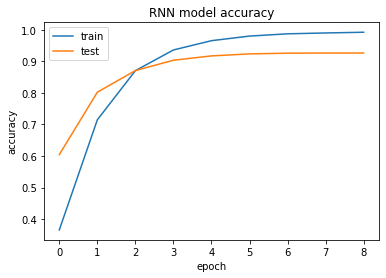

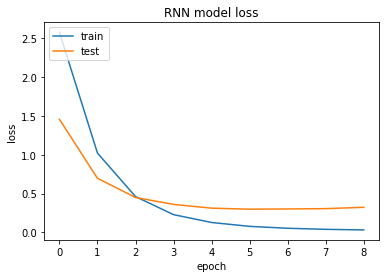

In [37]:
# Train the network and run classification
model_RNN = Build_Model_RNN_Text(word_index,embedding_matrix, 56)
run_classification(model_RNN, X_train_Glove, X_test_Glove, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='RNN')

## RNN with Bidirectional LSTM network

In [34]:
EMBEDDING_DIM = 200
#gloveFileName = 'glove.6B/glove.6B.100d.txt'
gloveFileName = '/content/glove.6B/glove.6B.200d.txt'

def Build_Model_LTSM_Text(word_index, embeddings_matrix, nclasses):
    kernel_size = 10
    filters = 100
    pool_size = 2
    gru_node = 128
    
    model = Sequential()
    model.add(Input(shape=(MAX_SEQUENCE_LENGTH,),dtype='int64'))
    model.add(Embedding(len(word_index) + 1,
                                EMBEDDING_DIM,
                                weights=[embeddings_matrix],
                                input_length=MAX_SEQUENCE_LENGTH,
                                trainable=True))

    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(MaxPooling1D(pool_size=pool_size))
    model.add(Dropout(0.3))
    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(MaxPooling1D(pool_size=pool_size))
    model.add(Bidirectional(LSTM(gru_node)))
    model.add(Dropout(0.3))
    model.add(Dense(100,activation='relu'))
    model.add(Dense(nclasses,activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])
    
    print(model.summary())
    return model

Found 44936 unique tokens.
(41252, 500)
Total 400001 word vectors.
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 500, 200)          8987400   
_________________________________________________________________
conv1d_6 (Conv1D)            (None, 491, 100)          200100    
_________________________________________________________________
max_pooling1d_6 (MaxPooling1 (None, 245, 100)          0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 245, 100)          0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 236, 100)          100100    
_________________________________________________________________
max_pooling1d_7 (MaxPooling1 (None, 118, 100)          0         
_____________________________________________________

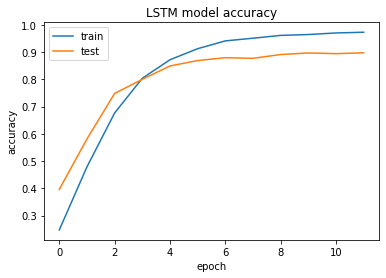

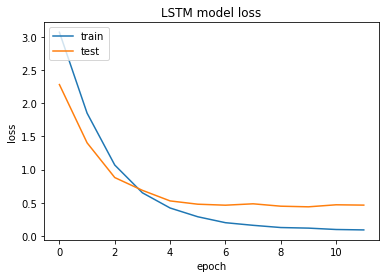

In [35]:
X_train_Glove,X_test_Glove, word_index,embeddings_index = loadData_Tokenizer(X_train,X_test,gloveFileName)
embedding_matrix = buildEmbed_matrices(word_index,EMBEDDING_DIM)

model_LTSM = Build_Model_LTSM_Text(word_index,embedding_matrix, 56                                                                                                                                                                        )
run_classification(model_LTSM, X_train_Glove, X_test_Glove, y_train, y_test,pipelineRequired = False,isDeepModel=True, arch_name='LSTM')